**Coronavirus (COVID-19) Visualization & Prediction** 

Coronavirus is a family of viruses that are named after their spiky crown. The novel coronavirus, also known as SARS-CoV-2, is a contagious respiratory virus that first reported in Wuhan, China. On 2/11/2020, the World Health Organization designated the name COVID-19 for the disease caused by the novel coronavirus. This notebook aims at exploring COVID-19 through data analysis and projections.

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 

plt.style.use('seaborn-v0_8-poster') 

%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings("ignore")

/tmp/ipykernel_443/2070573102.py:20: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')


In [2]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/08-25-2022.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/08-25-2022.csv')

In [3]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2022-08-26 04:21:02,33.93911,67.709953,191967,7771,NaN,NaN,Afghanistan,493.129157,4.048092
1,NaN,NaN,NaN,Albania,2022-08-26 04:21:02,41.15330,20.168300,327607,3579,NaN,NaN,Albania,11383.939120,1.092467
2,NaN,NaN,NaN,Algeria,2022-08-26 04:21:02,28.03390,1.659600,270097,6878,NaN,NaN,Algeria,615.942020,2.546493
3,NaN,NaN,NaN,Andorra,2022-08-26 04:21:02,42.50630,1.521800,46027,154,NaN,NaN,Andorra,59570.309972,0.334586
4,NaN,NaN,NaN,Angola,2022-08-26 04:21:02,-11.20270,17.873900,102636,1917,NaN,NaN,Angola,312.283707,1.867766


In [4]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,209322,209340,209358,209362,209369,209390,209406,209436,209451,209451
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,334391,334408,334408,334427,334427,334427,334427,334427,334443,334457
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,271441,271448,271463,271469,271469,271477,271477,271490,271494,271496
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,47866,47875,47875,47875,47875,47875,47875,47875,47890,47890
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,105255,105277,105277,105277,105277,105277,105277,105277,105288,105288


In [5]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,...,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,Date,People_Tested,Mortality_Rate
0,Alabama,US,2022-08-26 04:34:15,32.3182,-86.9023,1479605,20048,NaN,NaN,1.0,...,NaN,NaN,1.354956,84000001.0,USA,NaN,NaN,2022-08-25,NaN,NaN
1,Alaska,US,2022-08-26 04:34:15,61.3707,-152.4044,293076,1338,NaN,NaN,2.0,...,NaN,NaN,0.456537,84000002.0,USA,NaN,NaN,2022-08-25,NaN,NaN
2,American Samoa,US,2022-08-26 04:34:15,-14.2710,-170.1320,8168,34,NaN,NaN,60.0,...,NaN,NaN,0.416259,16.0,ASM,NaN,NaN,2022-08-25,NaN,NaN
3,Arizona,US,2022-08-26 04:34:15,33.7298,-111.4312,2245713,31047,NaN,NaN,4.0,...,20585287.0,NaN,1.382501,84000004.0,USA,282814.773538,NaN,2022-08-25,NaN,NaN
4,Arkansas,US,2022-08-26 04:34:15,34.9697,-92.3731,927072,11887,NaN,NaN,5.0,...,5435506.0,NaN,1.282209,84000005.0,USA,180114.613143,NaN,2022-08-25,NaN,NaN


In [6]:


confirmed_cols = confirmed_df.keys()
deaths_cols = deaths_df.keys()

In [7]:
confirmed = confirmed_df.loc[:, confirmed_cols[4]:]
deaths = deaths_df.loc[:, deaths_cols[4]:]

confirmed.keys()

In [8]:
num_dates = len(confirmed.keys())
ck = confirmed.keys()
dk = deaths.keys()

world_cases = []
total_deaths = [] 
mortality_rate = []


for i in range(num_dates):
    confirmed_sum = confirmed[ck[i]].sum()
    death_sum = deaths[dk[i]].sum()
    
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)


# Getting daily increases and moving averages

def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg= moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)

In [9]:


days_since_1_22 = np.array([i for i in range(len(ck))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)



     


In [10]:


days_in_future = 10
future_forcast = np.array([i for i in range(len(ck)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]



     


In [11]:


start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))



     


In [12]:
# slightly modify the data to fit the model better (regression models cannot pick the pattern), we are using data from 4/1/22 and onwards for the prediction modeling 
days_to_skip = 830
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22[days_to_skip:], world_cases[days_to_skip:], test_size=0.10, shuffle=False) 



     



In [13]:


# svm_confirmed = svm_search.best_estimator_
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forcast)



     


MAE: 30103288.29804635
MSE: 941321216443603.2


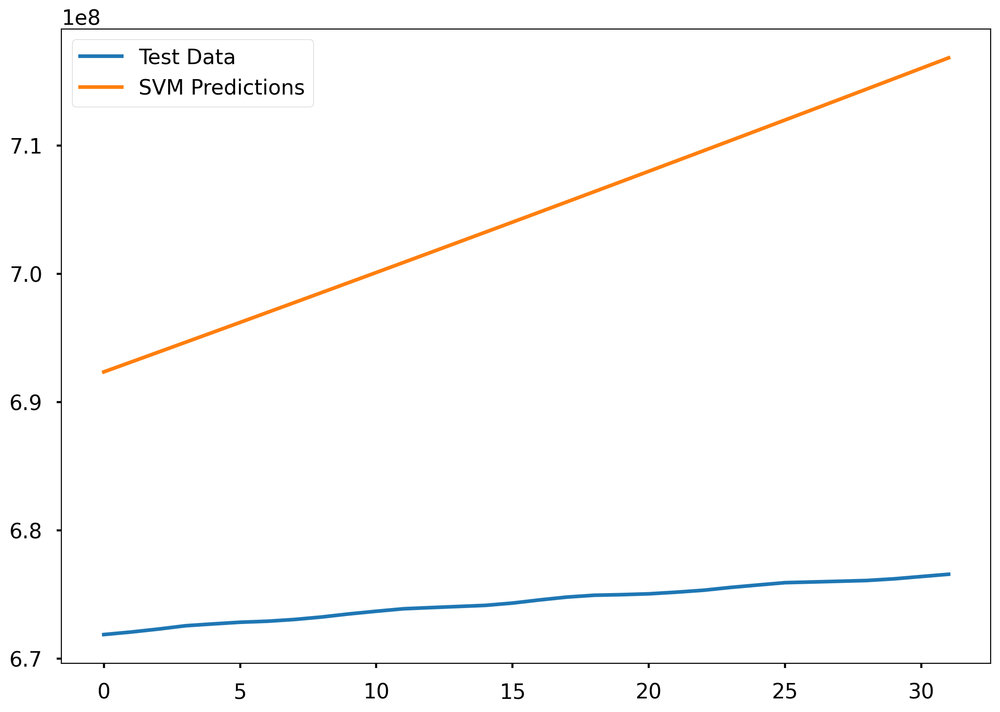

In [14]:
# check against testing data
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

In [15]:
# transform our data for polynomial regression
poly = PolynomialFeatures(degree=3)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forcast = poly.fit_transform(future_forcast)

bayesian_poly = PolynomialFeatures(degree=3)
bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_poly_future_forcast = bayesian_poly.fit_transform(future_forcast)

In [16]:
# polynomial regression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Create a scaler object
scaler = StandardScaler()

# Apply scaling to the features if needed
# poly_X_train_confirmed_scaled = scaler.fit_transform(poly_X_train_confirmed)
# poly_X_test_confirmed_scaled = scaler.transform(poly_X_test_confirmed)
# poly_future_forcast_scaled = scaler.transform(poly_future_forcast)

# Create and fit the model without the deprecated 'normalize' parameter
linear_model = LinearRegression(fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)

# Make predictions
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forcast)

# Evaluate the model
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:', mean_squared_error(test_linear_pred, y_test_confirmed))

MAE: 380440.42176456004
MSE: 202769400753.9959


In [17]:
print(linear_model.coef_)

[[ 3.93772854e+08 -1.51108163e+06  3.17220650e+03 -1.42886619e+00]]


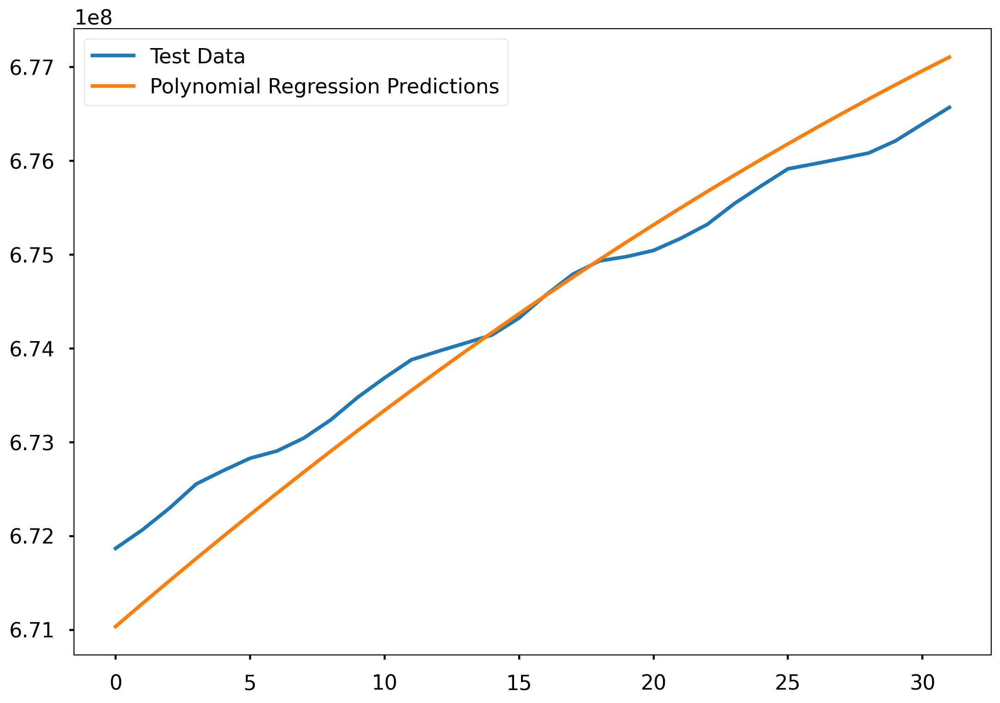

In [18]:


plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])



     


In [19]:
# bayesian ridge polynomial regression
tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
# Removed the 'normalize' parameter as it's not valid for BayesianRidge

bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2': alpha_2, 
                 'lambda_1': lambda_1, 'lambda_2': lambda_2}

bayesian = BayesianRidge(fit_intercept=False)
bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', 
                                    cv=3, return_train_score=True, n_jobs=-1, 
                                    n_iter=40, verbose=1)
bayesian_search.fit(bayesian_poly_X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/envs/anaconda-2024.02-py310/lib/python3.10/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A 

RandomizedSearchCV(cv=3, estimator=BayesianRidge(fit_intercept=False),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'alpha_2': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'lambda_1': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'lambda_2': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'tol': [1e-06, 1e-05, 0.0001, 0.001,
                                                0.01]},
                   return_train_score=True, scoring='neg_mean_squared_error',
                   verbose=1)

In [20]:
bayesian_search.best_params_

{'tol': 0.0001,
 'lambda_2': 0.001,
 'lambda_1': 1e-06,
 'alpha_2': 0.001,
 'alpha_1': 0.001}

In [21]:


bayesian_confirmed = bayesian_search.best_estimator_
test_bayesian_pred = bayesian_confirmed.predict(bayesian_poly_X_test_confirmed)
bayesian_pred = bayesian_confirmed.predict(bayesian_poly_future_forcast)
print('MAE:', mean_absolute_error(test_bayesian_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_bayesian_pred, y_test_confirmed))



     


MAE: 213215401.2080839
MSE: 4.587908910119024e+16


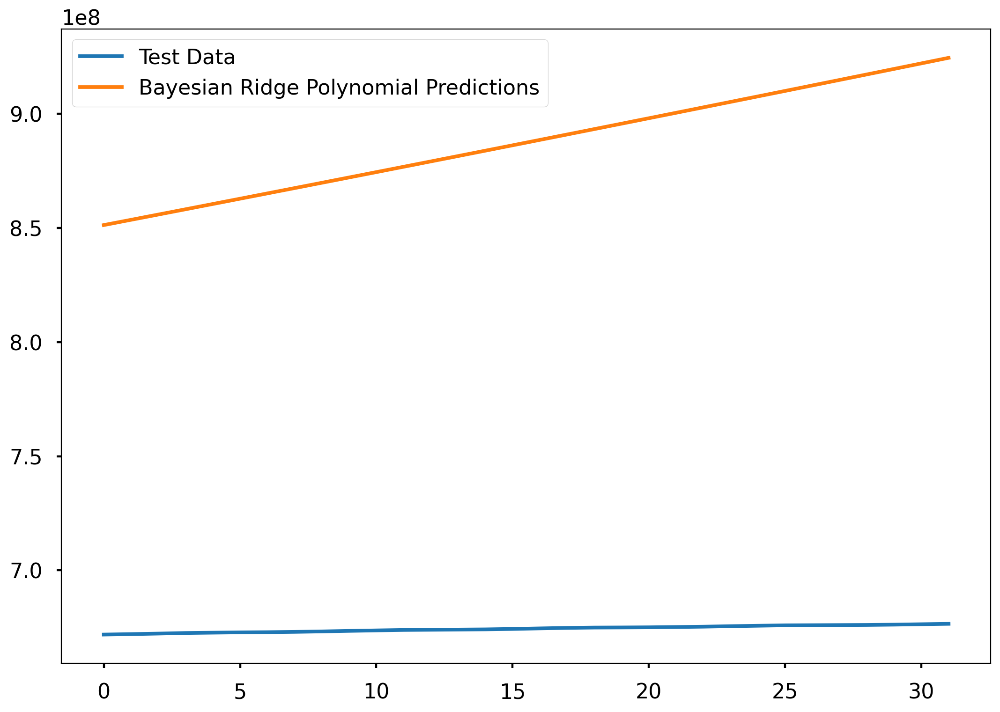

In [22]:


plt.plot(y_test_confirmed)
plt.plot(test_bayesian_pred)
plt.legend(['Test Data', 'Bayesian Ridge Polynomial Predictions'])



     


In [23]:


# helper method for flattening the data, so it can be displayed on a bar graph 
def flatten(arr):
    a = [] 
    arr = arr.tolist()
    for i in arr:
        a.append(i[0])
    return a



     


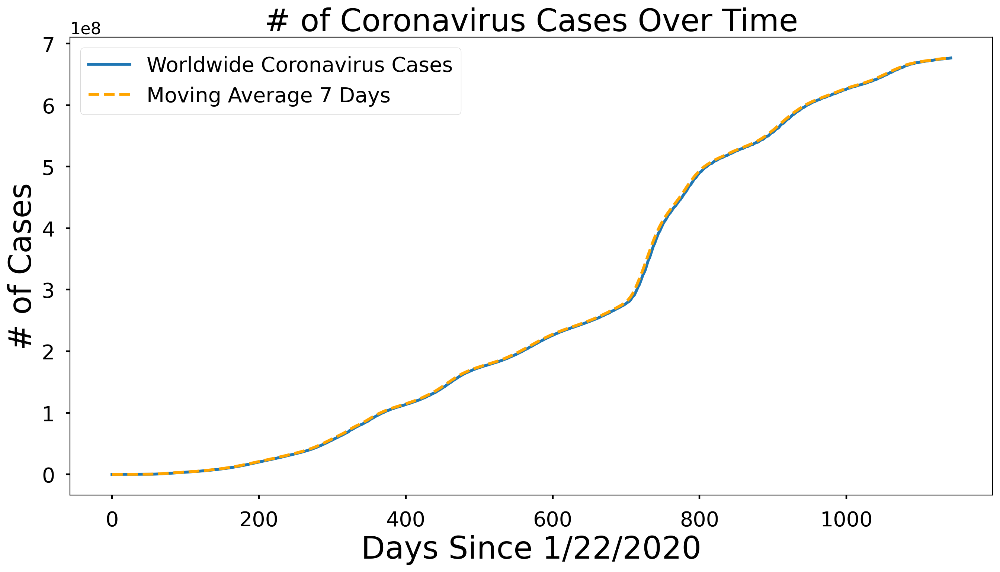

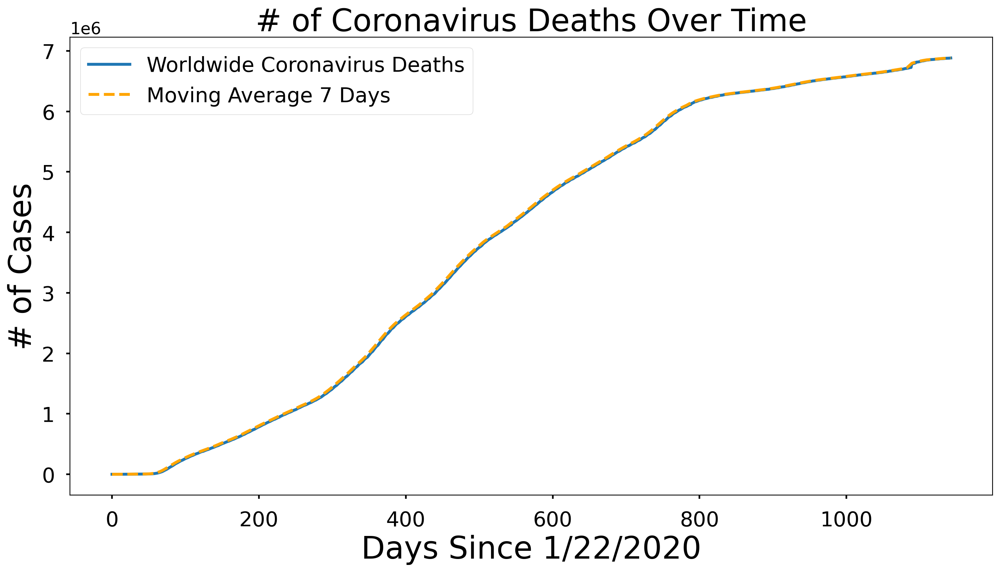

In [24]:


adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 8))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Deaths', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()



     


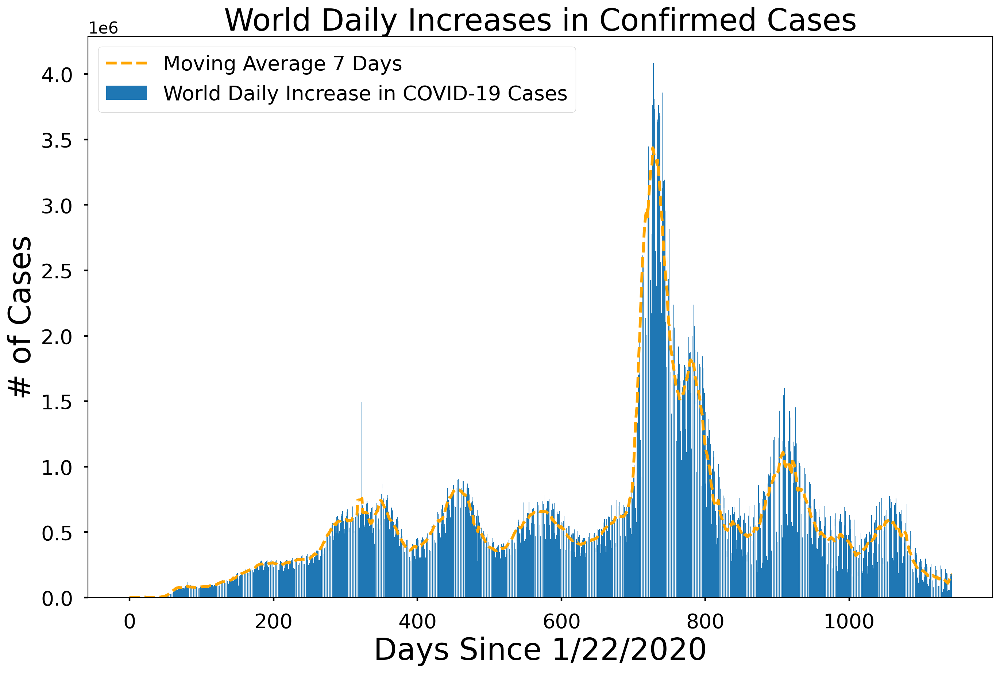

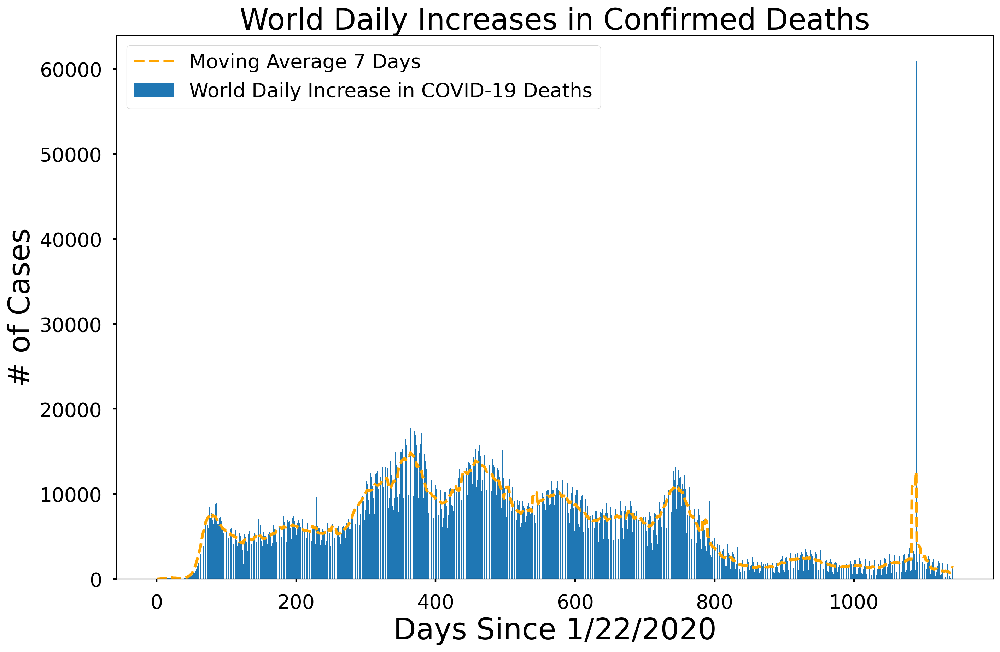

In [25]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


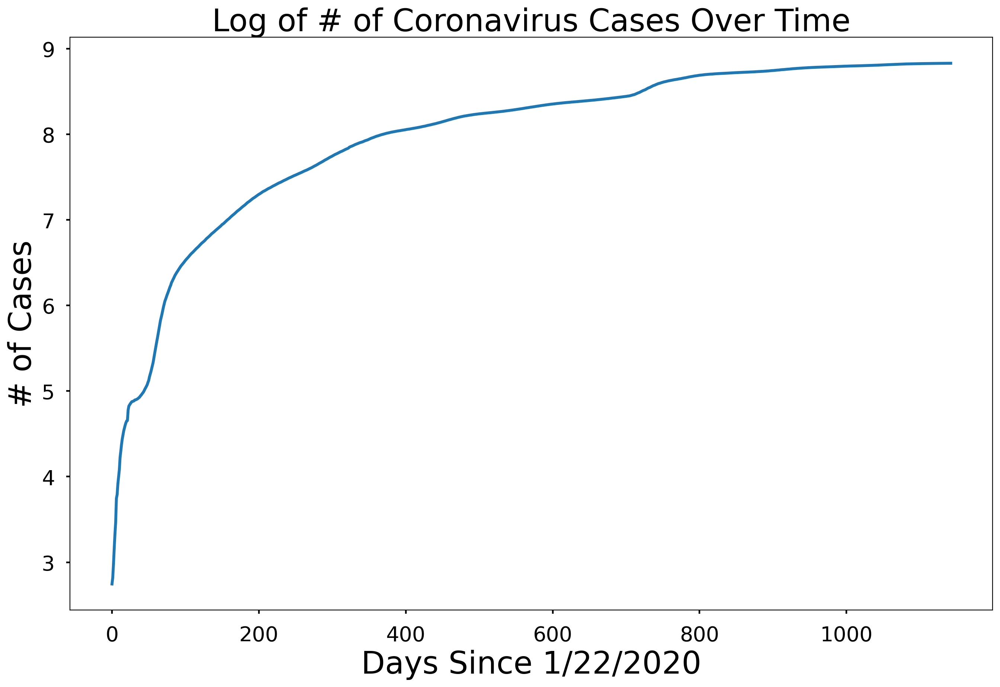

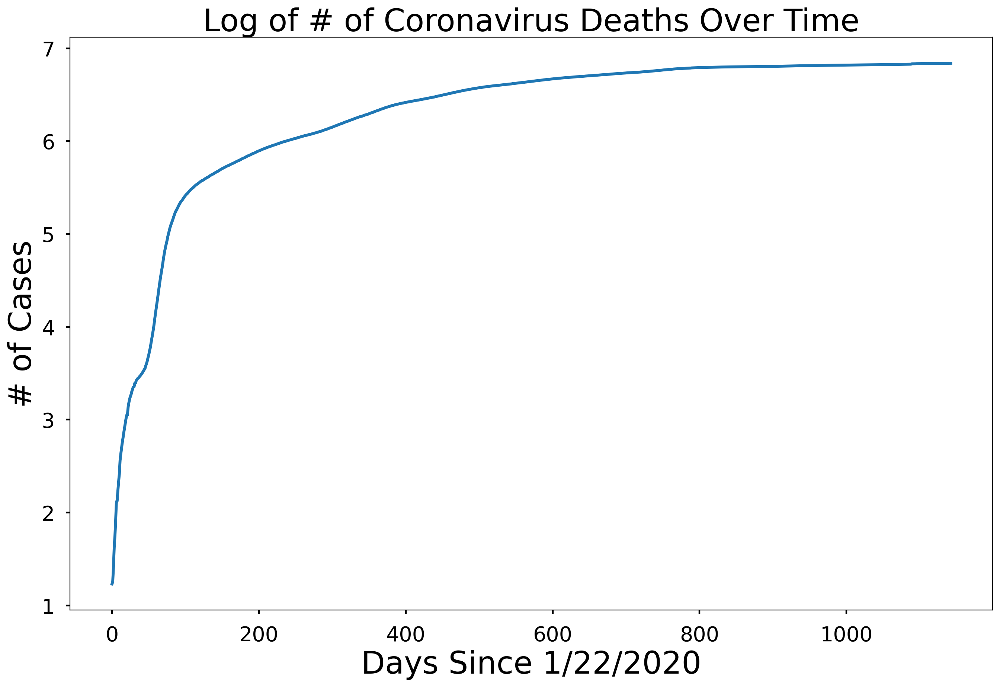

In [26]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of # of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_deaths))
plt.title('Log of # of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

# plt.figure(figsize=(16, 10))
# plt.plot(adjusted_dates, np.log10(total_recovered))
# plt.title('Log of # of Coronavirus Recoveries Over Time', size=30)
# plt.xlabel('Days Since 1/22/2020', size=30)
# plt.ylabel('# of Cases', size=30)
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()


In [27]:
def country_plot(x, y1, y2, y3, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
    SIZE = (12, 8)
    
    plt.figure(figsize=SIZE)
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=SIZE)
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=SIZE)
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()


# helper function for getting a country's total covid cases and deaths    
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    
    for i in range(num_dates):
        country_cases.append(confirmed_df[confirmed_df['Country/Region']==country_name][ck[i]].sum())
        country_deaths.append(deaths_df[deaths_df['Country/Region']==country_name][dk[i]].sum())
    return (country_cases, country_deaths)
    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_name)
    


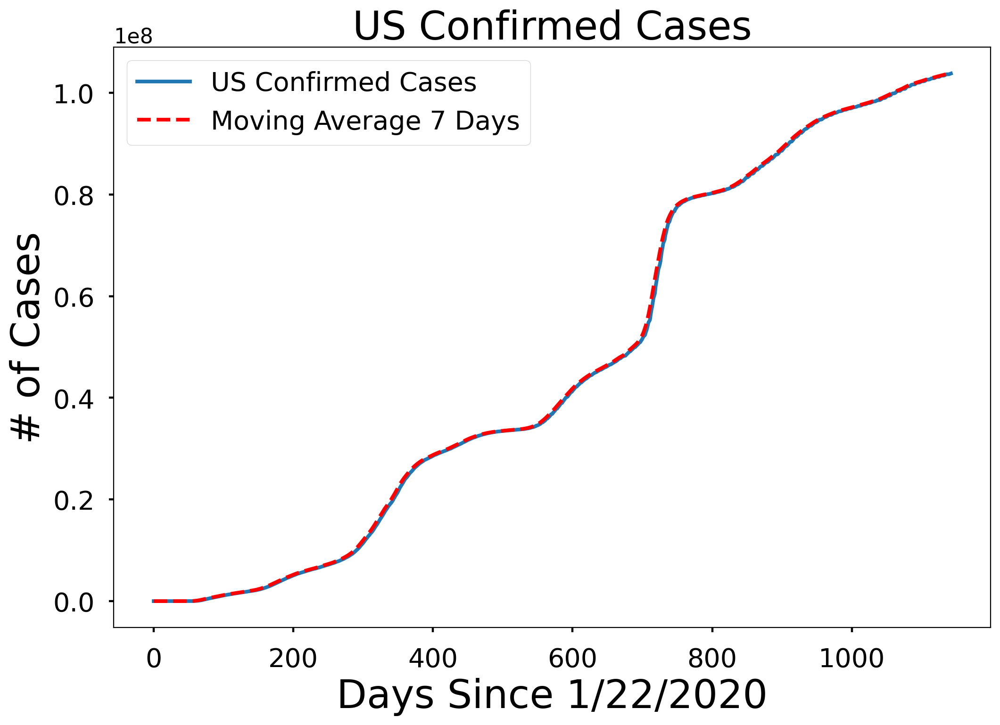

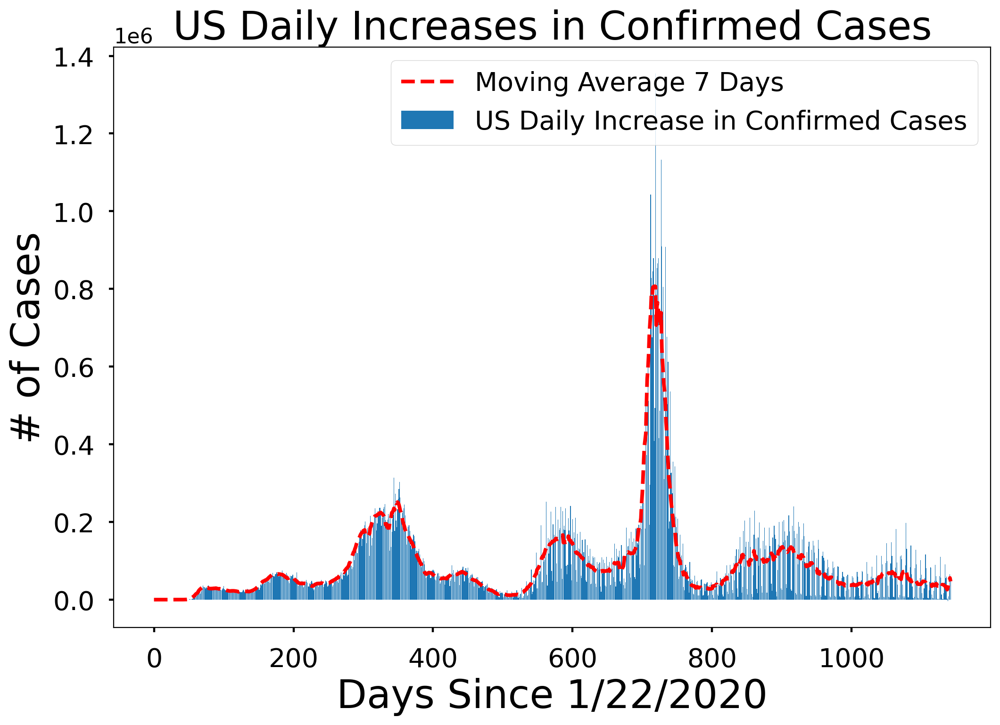

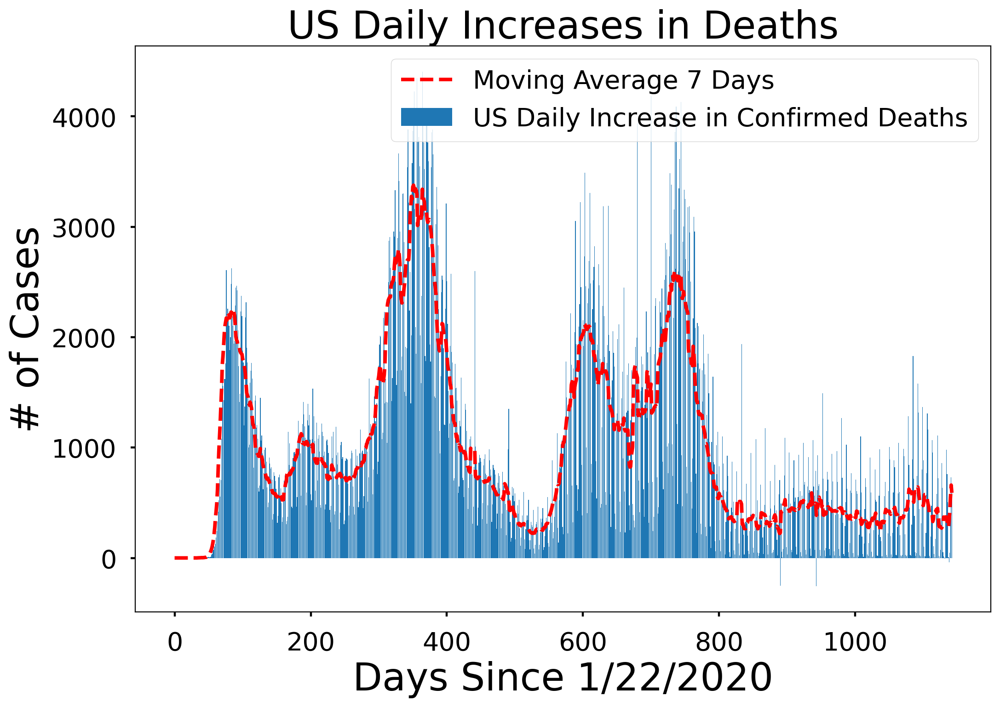

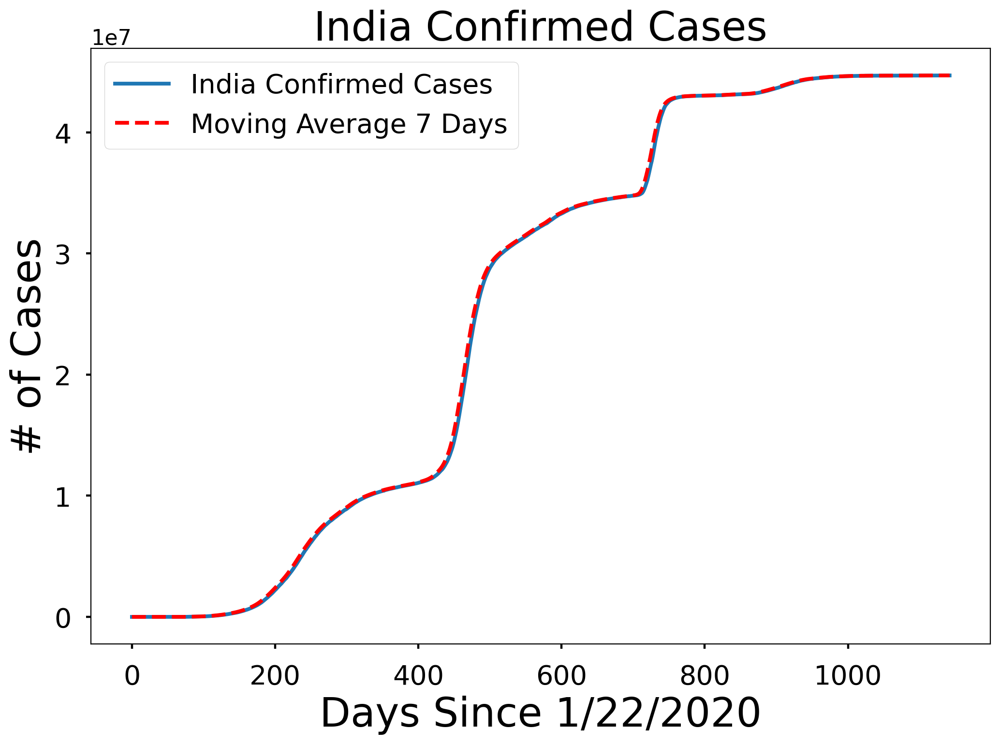

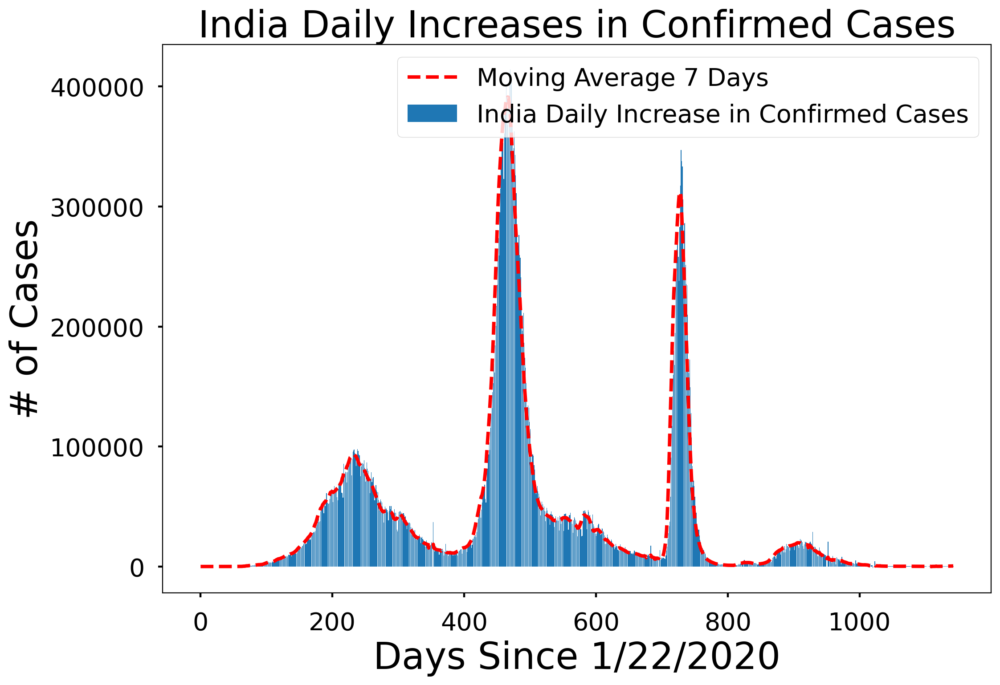

...

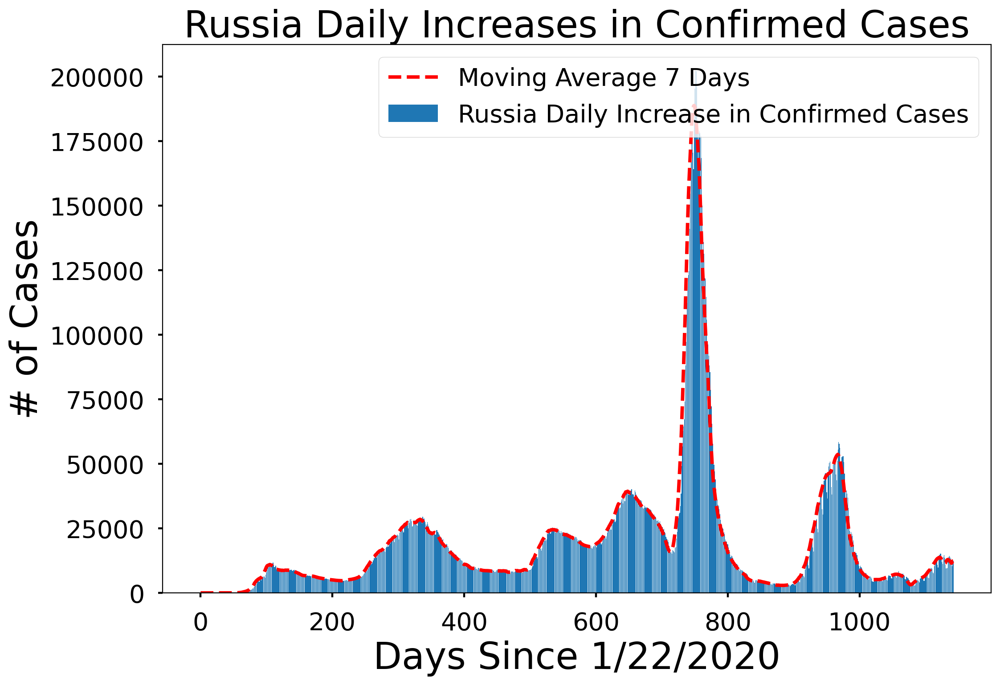

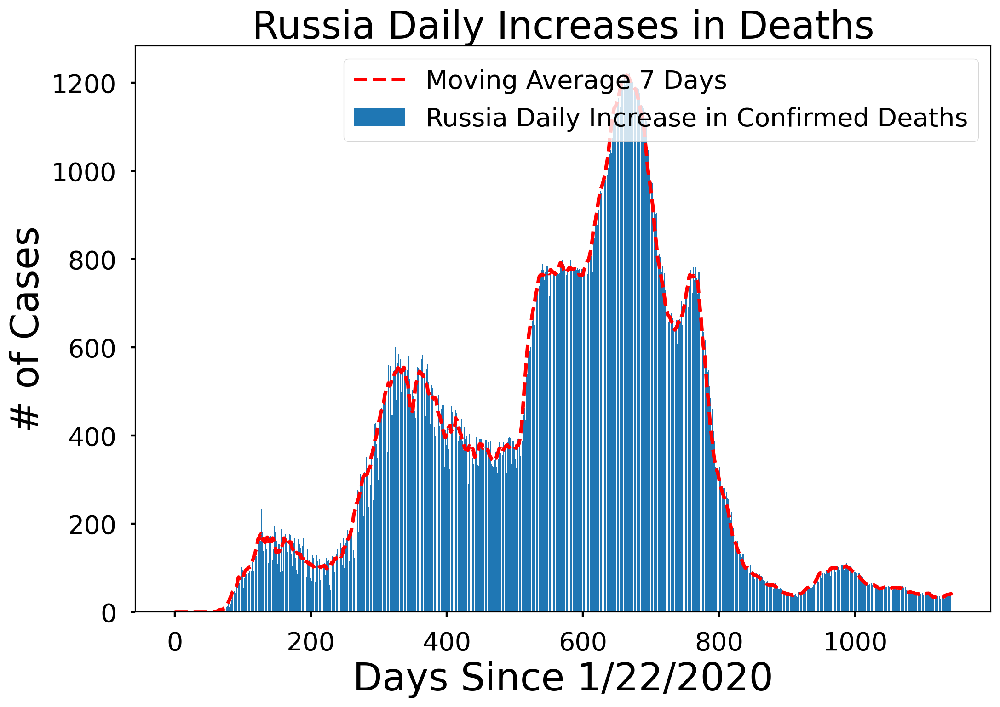

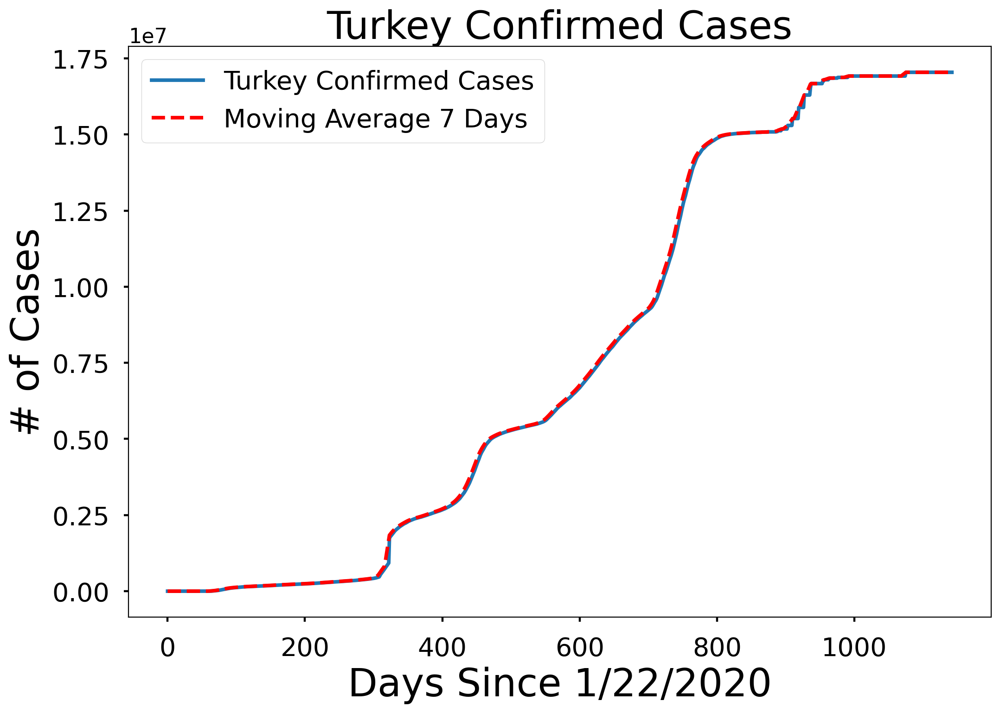

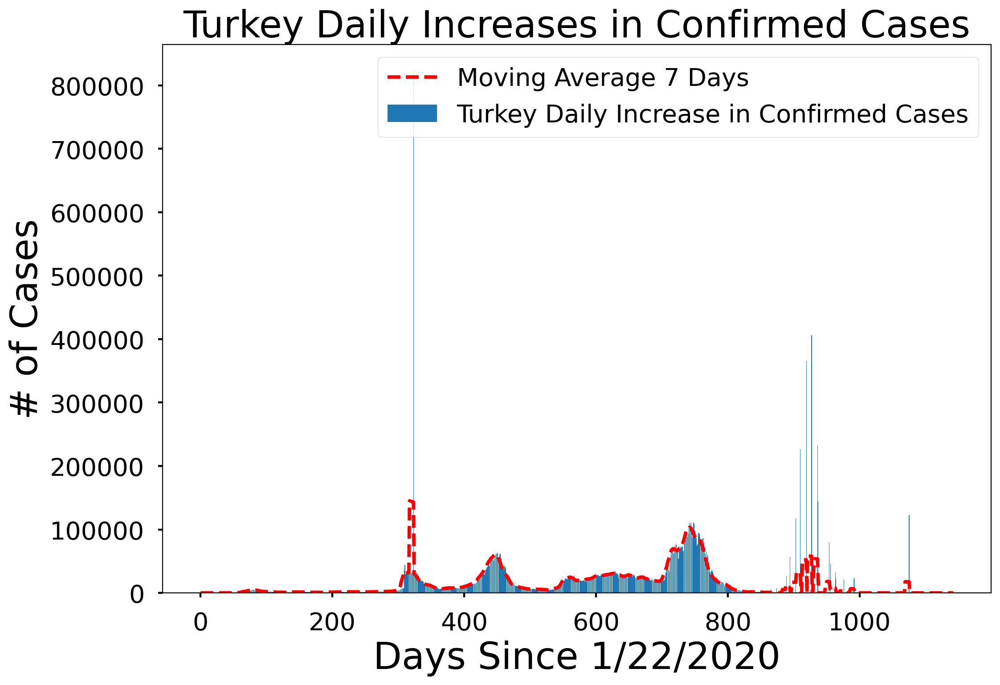

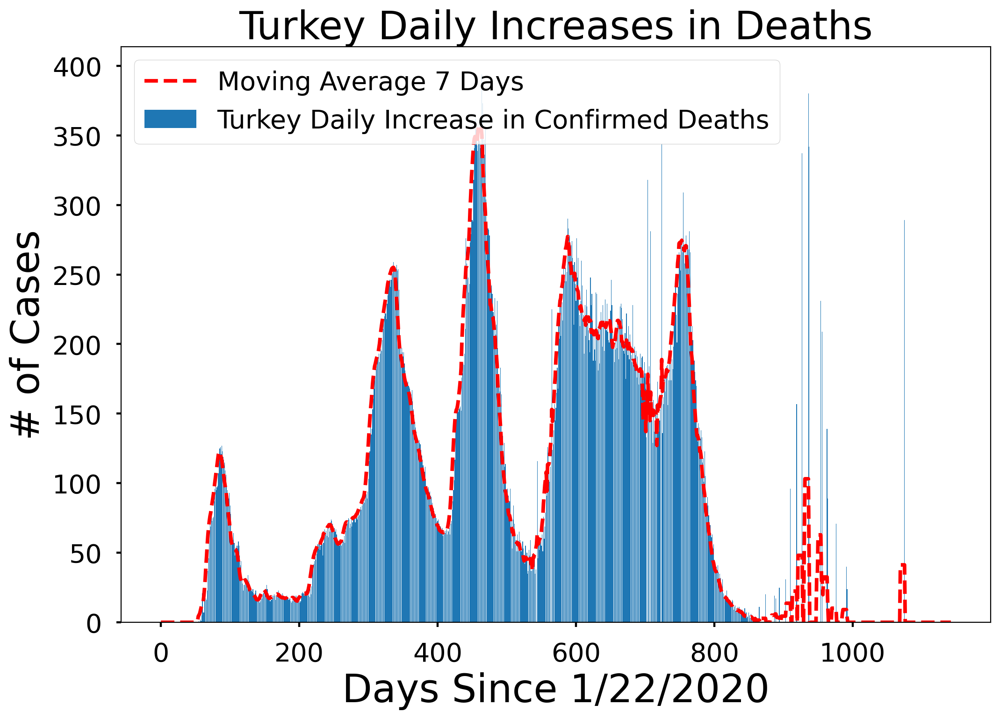

In [28]:
# top 10 total covid cases as of 7/13/2022
countries = ['US', 'India', 'Brazil', 'France', 'Germany', 'United Kingdom', 'Italy', 'Korea, South',
             'Russia', 'Turkey']

for country in countries:
    country_visualizations(country)


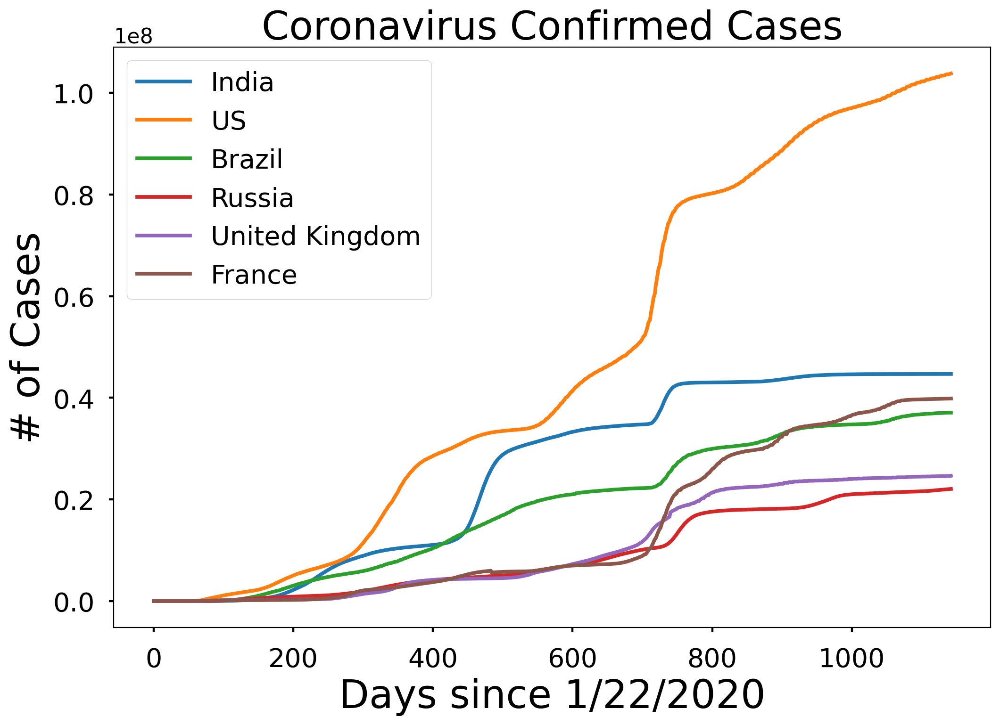

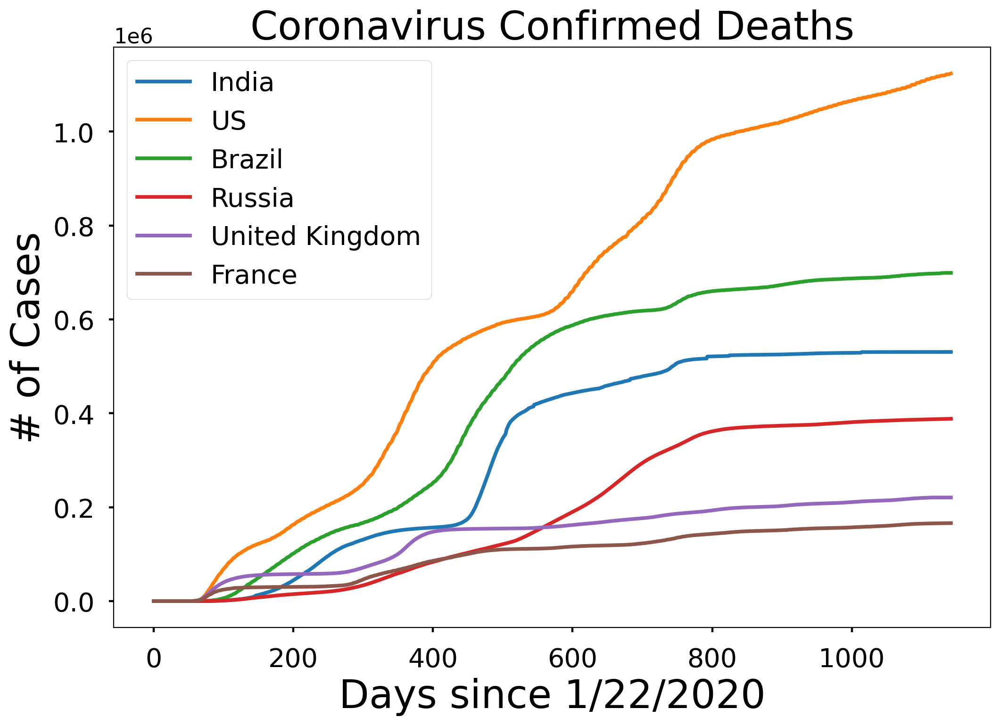

In [29]:
# Country Comparison
# removed redundant code

compare_countries = ['India', 'US', 'Brazil', 'Russia', 'United Kingdom', 'France'] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths']

for num in range(2):
    plt.figure(figsize=(12, 8))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()


In [30]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(12, 8))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()


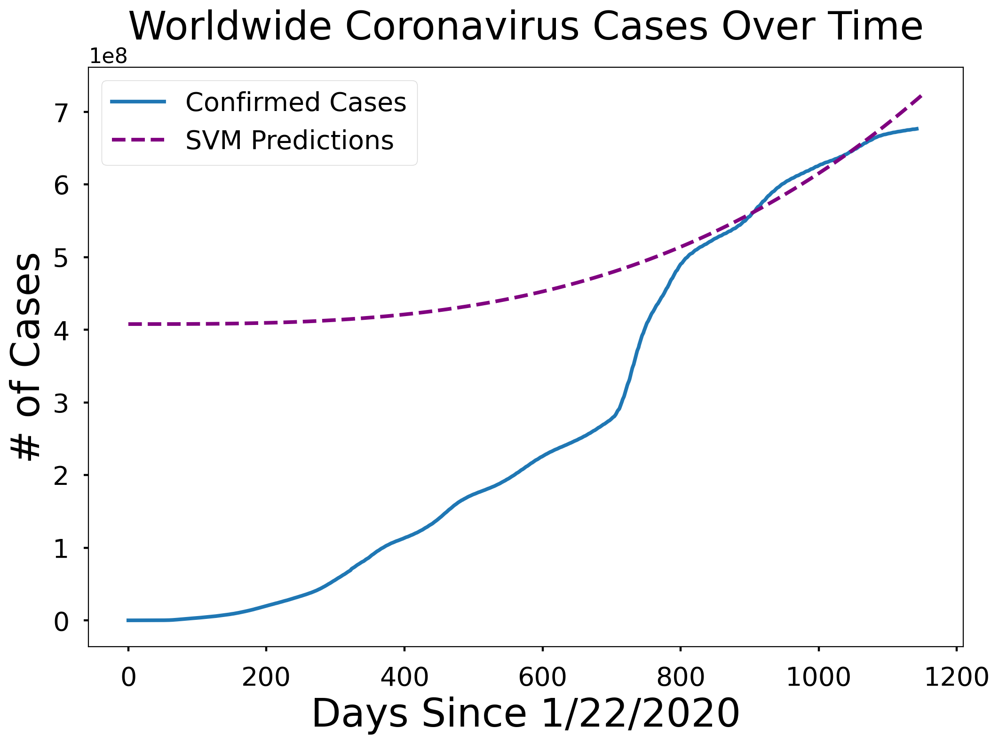

In [31]:
plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM Predictions', 'purple')

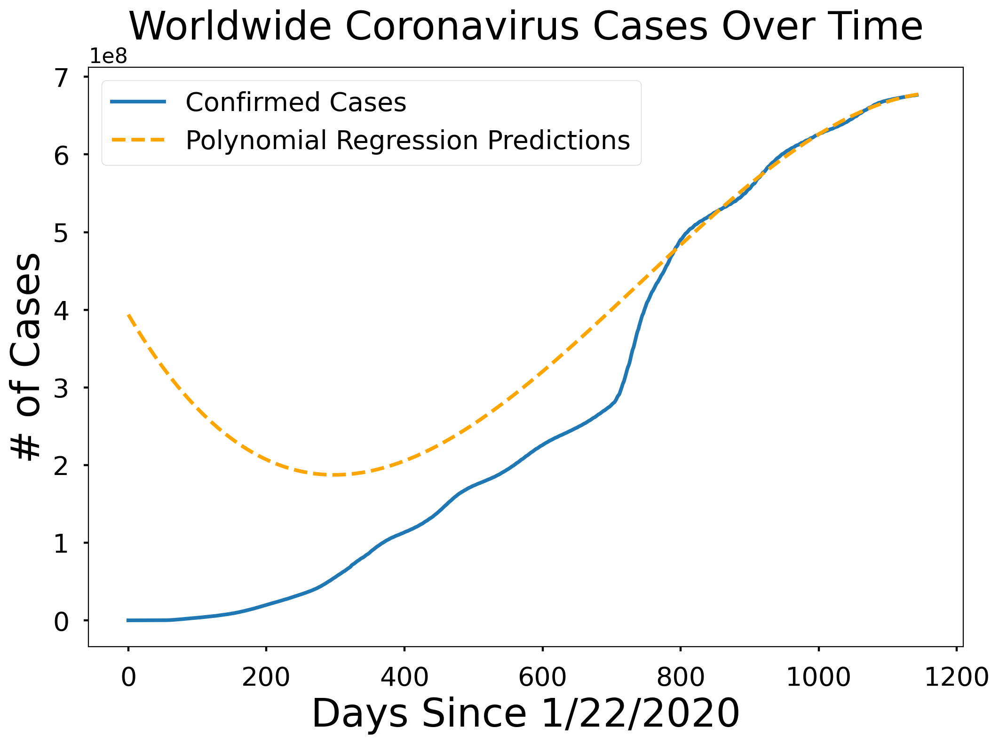

In [32]:
plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial Regression Predictions', 'orange')

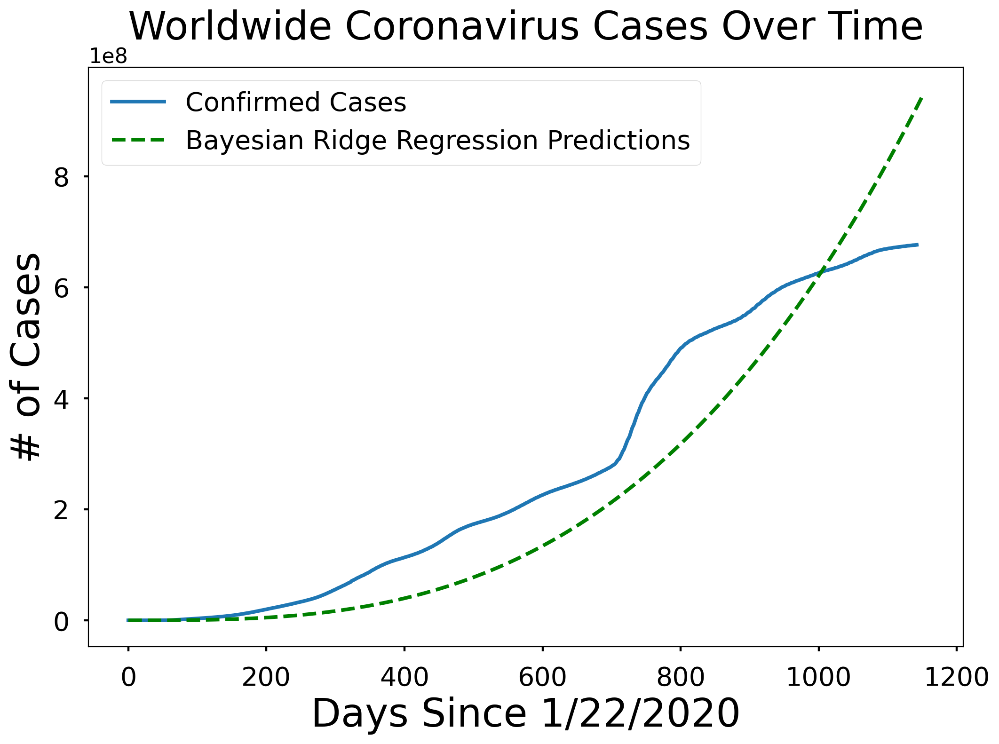

In [33]:
plot_predictions(adjusted_dates, world_cases, bayesian_pred, 'Bayesian Ridge Regression Predictions', 'green')

In [34]:
# Future predictions using SVM 
svm_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'SVM Predicted # of Confirmed Cases Worldwide': np.round(svm_pred[-10:])})
svm_df.style.background_gradient(cmap='Reds')

,Date,SVM Predicted # of Confirmed Cases Worldwide
0,03/10/2023,717653310.000000
1,03/11/2023,718467277.000000
2,03/12/2023,719282668.000000
3,03/13/2023,720099485.000000
4,03/14/2023,720917729.000000
5,03/15/2023,721737400.000000
6,03/16/2023,722558501.000000
7,03/17/2023,723381032.000000
8,03/18/2023,724204995.000000
9,03/19/2023,725030391.000000


In [35]:
# Future predictions using polynomial regression
linear_pred = linear_pred.reshape(1,-1)[0]
linear_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Polynomial Predicted # of Confirmed Cases Worldwide': np.round(linear_pred[-10:])})
linear_df.style.background_gradient(cmap='Reds')


,Date,Polynomial Predicted # of Confirmed Cases Worldwide
0,03/10/2023,677247824.000000
1,03/11/2023,677386455.000000
2,03/12/2023,677521623.000000
3,03/13/2023,677653319.000000
4,03/14/2023,677781534.000000
5,03/15/2023,677906261.000000
6,03/16/2023,678027490.000000
7,03/17/2023,678145212.000000
8,03/18/2023,678259420.000000
9,03/19/2023,678370105.000000


In [36]:
# Future predictions using Bayesian Ridge 
bayesian_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Bayesian Ridge Predicted # of Confirmed Cases Worldwide': np.round(bayesian_pred[-10:])})
bayesian_df.style.background_gradient(cmap='Reds')


,Date,Bayesian Ridge Predicted # of Confirmed Cases Worldwide
0,03/10/2023,926987278.000000
1,03/11/2023,929422348.000000
2,03/12/2023,931861679.000000
3,03/13/2023,934305274.000000
4,03/14/2023,936753138.000000
5,03/15/2023,939205273.000000
6,03/16/2023,941661684.000000
7,03/17/2023,944122374.000000
8,03/18/2023,946587347.000000
9,03/19/2023,949056607.000000


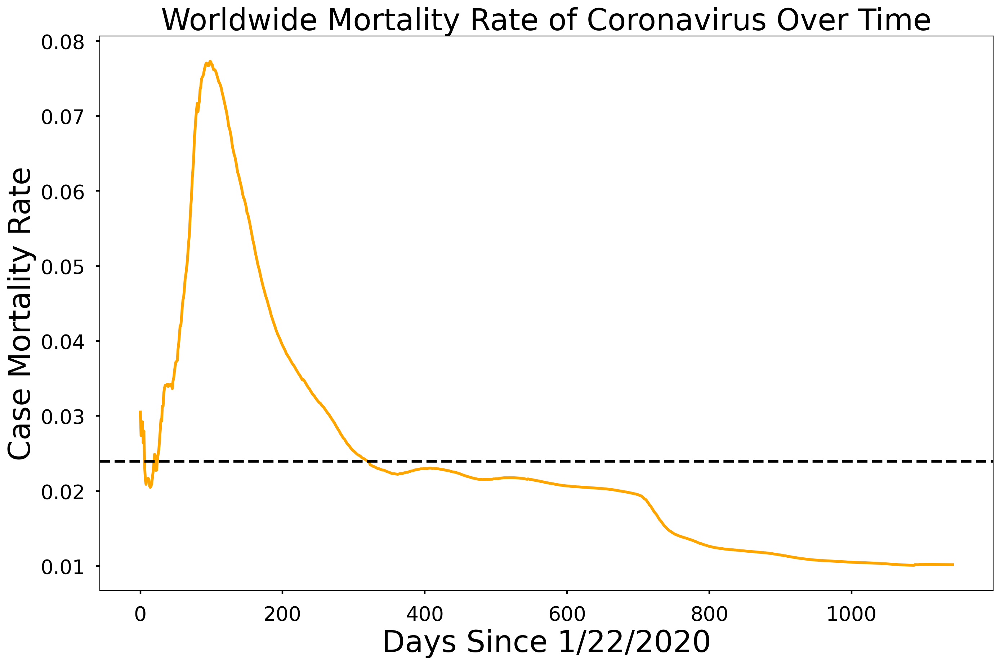

In [37]:


mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Worldwide Mortality Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()



     


In [38]:
unique_countries =  list(latest_data['Country_Region'].unique())

In [39]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])



     


In [40]:


country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': [format(int(i), ',d') for i in country_confirmed_cases],
                          'Number of Deaths': [format(int(i), ',d') for i in country_death_cases], 
                          'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate': country_mortality_rate})
# number of cases per country/region

country_df.style.background_gradient(cmap='Oranges')



     


,Country Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,US,"94,051,364","1,043,101",88820635.644683,0.011091
1,India,"44,389,176","527,556",200544.270471,0.011885
2,France,"34,644,718","154,846",447832.222086,0.004470
3,Brazil,"34,350,639","683,233",496450.854800,0.019890
4,Germany,"31,970,779","146,913",602444.503590,0.004595
5,United Kingdom,"23,708,470","207,496",562595.162573,0.008752
6,"Korea, South","22,802,985","26,413",44476.981426,0.001158
7,Italy,"21,745,065","175,127",758220.990706,0.008054
8,Russia,"18,985,174","376,052",1075253.059789,0.019808
9,Japan,"18,018,770","38,248",581541.528681,0.002123


In [41]:
unique_provinces =  list(latest_data['Province_State'].unique())

In [42]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
#     province_recovery_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Recovered'].sum())
#     province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])


In [43]:

province_limit = 100 
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit], 'Number of Confirmed Cases': [format(int(i), ',d') for i in province_confirmed_cases[:province_limit]],
                          'Number of Deaths': [format(int(i), ',d') for i in province_death_cases[:province_limit]], 
                        'Incidence Rate' : province_incidence_rate[:province_limit], 'Mortality Rate': province_mortality_rate[:province_limit]})
# number of cases per country/region

province_df.style.background_gradient(cmap='Oranges')


,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,England,United Kingdom,"19,808,426","175,256",35386.596686,0.008848
1,California,US,"11,053,518","94,552",1437886.537764,0.008554
2,Maharashtra,India,"8,091,276","148,214",6570.568885,0.018318
3,Texas,US,"7,774,590","89,842",6694883.209554,0.011556
4,Florida,US,"6,991,770","79,450",1971657.530314,0.011363
5,Kerala,India,"6,748,557","70,759",18903.815950,0.010485
6,Nordrhein-Westfalen,Germany,"6,537,827","26,918",36517.645941,0.004117
7,Sao Paulo,Brazil,"6,013,105","174,019",13095.012050,0.028940
8,New York,US,"5,963,876","70,995",1574249.051190,0.011904
9,Bayern,Germany,"5,814,135","25,362",44502.234161,0.004362


In [44]:
# return the data table with province/state info for a given country
def country_table(country_name):
    states = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = [] 
    # state_recovery_cases = []
#     state_active = [] 
    state_incidence_rate = [] 
    state_mortality_rate = [] 

    no_cases = [] 
    for i in states:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State']==states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latest_data[latest_data['Province_State']==states[i]]['Recovered'].sum())
#         state_active.append(latest_data[latest_data['Province_State']==states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State']==states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': [format(int(i), ',d') for i in state_confirmed_cases],
                              'Number of Deaths': [format(int(i), ',d') for i in state_death_cases], 
                             'Incidence Rate' : state_incidence_rate, 'Mortality Rate': state_mortality_rate})
    # number of cases per country/region
    return state_df




In [45]:


us_table = country_table('US')
us_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,California,"11,053,518","94,552",1437886.537764,0.008554
1,Texas,"7,774,590","89,842",6694883.209554,0.011556
2,Florida,"6,991,770","79,450",1971657.530314,0.011363
3,New York,"5,963,876","70,995",1574249.051190,0.011904
4,Illinois,"3,666,458","39,265",3319543.524727,0.010709
5,Pennsylvania,"3,167,638","46,596",1694298.447048,0.014710
6,North Carolina,"3,098,923","25,843",2885376.985003,0.008339
7,Ohio,"3,049,546","39,700",2346758.131259,0.013018
8,Georgia,"2,852,706","39,632",4125521.395183,0.013893
9,Michigan,"2,751,201","37,909",2075011.176514,0.013779


In [46]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Maharashtra,"8,091,276","148,214",6570.568885,0.018318
1,Kerala,"6,748,557","70,759",18903.815950,0.010485
2,Karnataka,"4,046,105","40,224",5988.668064,0.009941
3,Tamil Nadu,"3,565,562","38,034",4580.554939,0.010667
4,Andhra Pradesh,"2,336,386","14,733",4334.395054,0.006306
5,Uttar Pradesh,"2,120,843","23,600",891.549817,0.011128
6,West Bengal,"2,105,787","21,451",2114.046516,0.010187
7,Delhi,"1,997,054","26,446",10673.199322,0.013243
8,Odisha,"1,326,121","9,168",2860.711548,0.006913
9,Rajasthan,"1,306,844","9,620",1612.736806,0.007361


In [47]:
brazil_table = country_table('Brazil')
brazil_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Sao Paulo,"6,013,105","174,019",13095.012050,0.028940
1,Minas Gerais,"3,867,474","63,465",18269.697122,0.016410
2,Parana,"2,729,490","45,076",23871.788218,0.016514
3,Rio Grande do Sul,"2,702,578","40,801",23754.251800,0.015097
4,Rio de Janeiro,"2,480,042","75,351",14364.611572,0.030383
5,Santa Catarina,"1,859,669","22,342",25955.673776,0.012014
6,Bahia,"1,683,395","30,617",11318.414282,0.018188
7,Goias,"1,670,745","27,434",23805.368039,0.016420
8,Ceara,"1,379,242","27,541",15103.265653,0.019968
9,Espirito Santo,"1,213,570","14,777",30198.449728,0.012176


In [48]:


russia_table = country_table('Russia')
russia_table.style.background_gradient(cmap='Oranges')



     


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Moscow,"2,990,057","44,955",23908.085000,0.015035
1,Saint Petersburg,"1,634,921","34,609",30548.222278,0.021169
2,Moscow Oblast,"1,043,721","15,256",13910.001952,0.014617
3,Sverdlovsk Oblast,"463,613","10,799",10718.741272,0.023293
4,Nizhny Novgorod Oblast,"436,657","11,619",13498.932839,0.026609
5,Voronezh Oblast,"403,864","8,371",17305.233425,0.020727
6,Samara Oblast,"400,365","7,951",12536.816811,0.019859
7,Rostov Oblast,"395,776","10,972",9377.573776,0.027723
8,Perm Krai,"383,757","8,862",14629.780849,0.023093
9,Krasnoyarsk Krai,"380,087","10,935",13213.537160,0.028770


In [49]:


uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')



     


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,England,"19,808,426","175,256",35386.596686,0.008848
1,Scotland,"2,087,616","15,609",38211.630333,0.007477
2,Unknown,"1,018,899","36,586",0.000000,0.035907
3,Wales,"883,539","10,762",28150.735997,0.012181
4,Northern Ireland,"713,294","4,837",37908.907313,0.006781
5,Jersey,"58,733",135,53735.590119,0.002299
6,Isle of Man,"38,008",116,44698.466460,0.003052
7,Guernsey,"30,651",62,48652.380952,0.002023
8,Cayman Islands,"30,057",29,45734.936093,0.000965
9,Gibraltar,"20,049",107,59508.474073,0.005337


In [50]:


france_table = country_table('France')
france_table.style.background_gradient(cmap='Oranges')



     


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Reunion,"454,665",855,50783.082470,0.001881
1,Martinique,"213,889","1,009",56996.788936,0.004717
2,Guadeloupe,"190,054",978,47498.419252,0.005146
3,French Guiana,"93,420",408,31277.412097,0.004367
4,French Polynesia,"76,415",649,27203.243813,0.008493
5,New Caledonia,"73,633",314,25791.706218,0.004264
6,Mayotte,"39,895",187,14623.569991,0.004687
7,St Martin,"11,857",63,30670.736439,0.005313
8,Saint Barthelemy,"5,208",6,52685.887709,0.001152
9,Saint Pierre and Miquelon,"3,131",1,54029.335634,0.000319


In [51]:
italy_table = country_table('Italy')
italy_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Lombardia,"3,456,021","42,154",34352.125435,0.012197
1,Veneto,"2,183,613","15,325",44510.354364,0.007018
2,Campania,"2,171,755","11,052",37433.131576,0.005089
3,Lazio,"2,009,161","11,959",34174.740206,0.005952
4,Emilia-Romagna,"1,812,352","17,849",40640.460754,0.009849
5,Sicilia,"1,612,060","12,035",32241.902873,0.007466
6,Puglia,"1,446,656","8,969",35905.608588,0.006200
7,Piemonte,"1,422,156","13,587",32645.166681,0.009554
8,Toscana,"1,371,148","10,626",36763.538367,0.007750
9,Marche,"600,626","4,087",39378.313755,0.006805


In [52]:
germany_table = country_table('Germany')
germany_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Nordrhein-Westfalen,"6,537,827","26,918",36517.645941,0.004117
1,Bayern,"5,814,135","25,362",44502.234161,0.004362
2,Baden-Wurttemberg,"4,370,737","16,886",39514.584762,0.003863
3,Niedersachsen,"3,073,696","10,401",38560.125916,0.003384
4,Hessen,"2,396,306","10,874",38287.745445,0.004538
5,Sachsen,"1,703,368","15,869",41804.986198,0.009316
6,Rheinland-Pfalz,"1,437,718","6,047",35232.165537,0.004206
7,Berlin,"1,221,447","4,752",33568.570900,0.003890
8,Unknown,"1,018,899","36,586",0.000000,0.035907
9,Schleswig-Holstein,"975,000","2,809",33695.306955,0.002881


In [53]:
spain_table = country_table('Spain')
spain_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Catalonia,"2,621,995","20,344",34652.995580,0.007759
1,Madrid,"1,912,985","19,072",28802.862060,0.009970
2,Andalusia,"1,574,914","14,325",18688.006569,0.009096
3,C. Valenciana,"1,541,004","9,921",30975.147785,0.006438
4,Unknown,"1,018,899","36,586",0.000000,0.035907
5,Castilla y Leon,"814,855","9,101",33843.245908,0.011169
6,Pais Vasco,"768,984","7,114",35308.832443,0.009251
7,Galicia,"723,555","3,863",26793.956987,0.005339
8,Castilla - La Mancha,"584,295","7,767",28714.020553,0.013293
9,Aragon,"455,529","5,160",34494.459278,0.011327


In [54]:
china_table = country_table('China')
china_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Hong Kong,"1,487,972","9,643",19847.597462,0.006481
1,Unknown,"1,018,899","36,586",0.000000,0.035907
2,Hubei,"68,421","4,512",115.634612,0.065945
3,Shanghai,"63,803",595,263.213696,0.009326
4,Jilin,"40,309",5,149.071746,0.000124
5,Guangdong,"8,823",8,7.776309,0.000907
6,Hainan,"8,499",6,90.995717,0.000706
7,Fujian,"4,021",1,10.202994,0.000249
8,Beijing,"3,956",9,18.365831,0.002275
9,Shaanxi,"3,630",3,9.394410,0.000826


In [55]:
mexico_table = country_table('Mexico')
mexico_table.style.background_gradient(cmap='Oranges')


,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Ciudad de Mexico,"1,719,273","43,470",19063.540033,0.025284
1,Unknown,"1,018,899","36,586",0.000000,0.035907
2,Mexico,"693,713","47,782",3980.498962,0.068879
3,Nuevo Leon,"396,127","15,307",7060.894774,0.038642
4,Guanajuato,"348,698","15,043",5598.718726,0.043140
5,Jalisco,"280,510","19,927",3335.555769,0.071038
6,San Luis Potosi,"233,997","7,587",8164.180281,0.032423
7,Veracruz,"221,690","16,981",2595.943588,0.076598
8,Tabasco,"212,908","6,122",8276.992420,0.028754
9,Puebla,"206,149","16,629",3121.364668,0.080665


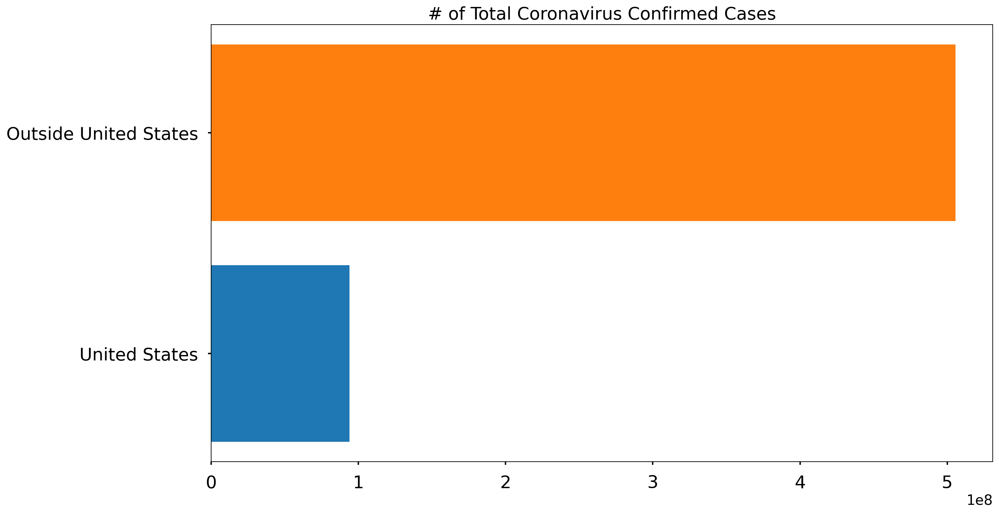

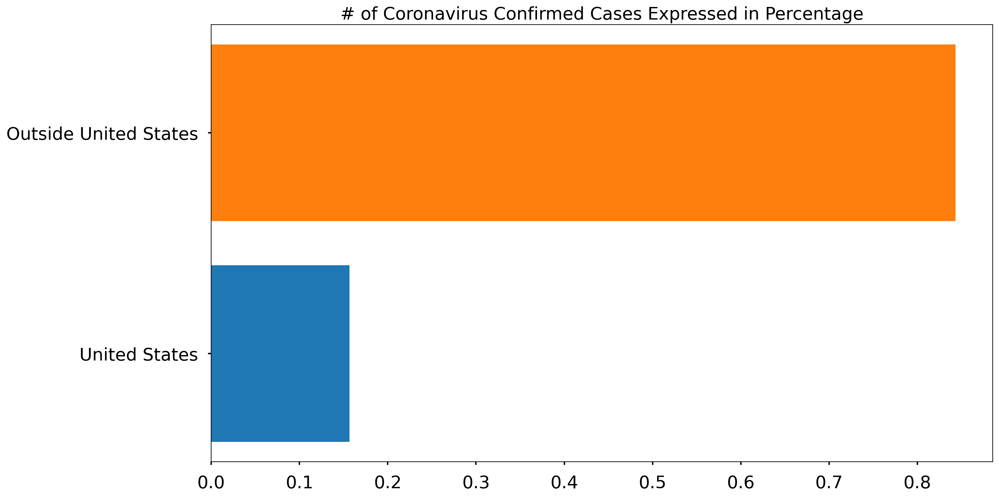

In [56]:


total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region']=='US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed/total_world_cases)
plt.barh('Outside United States', outside_us_confirmed/total_world_cases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()



     


In [57]:


print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))



     


Outside United States 505648260 cases (84.3%):
United States 94051364 cases (15.7%)
Total: 599699624 cases


In [58]:


# Only show 10 countries with the most confirmed cases, the rest are grouped into the other category
visual_unique_countries = [] 
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    visual_unique_countries.append(unique_countries[i])
    visual_confirmed_cases.append(country_confirmed_cases[i])
    
visual_unique_countries.append('Others')
visual_confirmed_cases.append(others)



     


In [59]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    
# good for a lot x values 
def plot_bar_graphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()


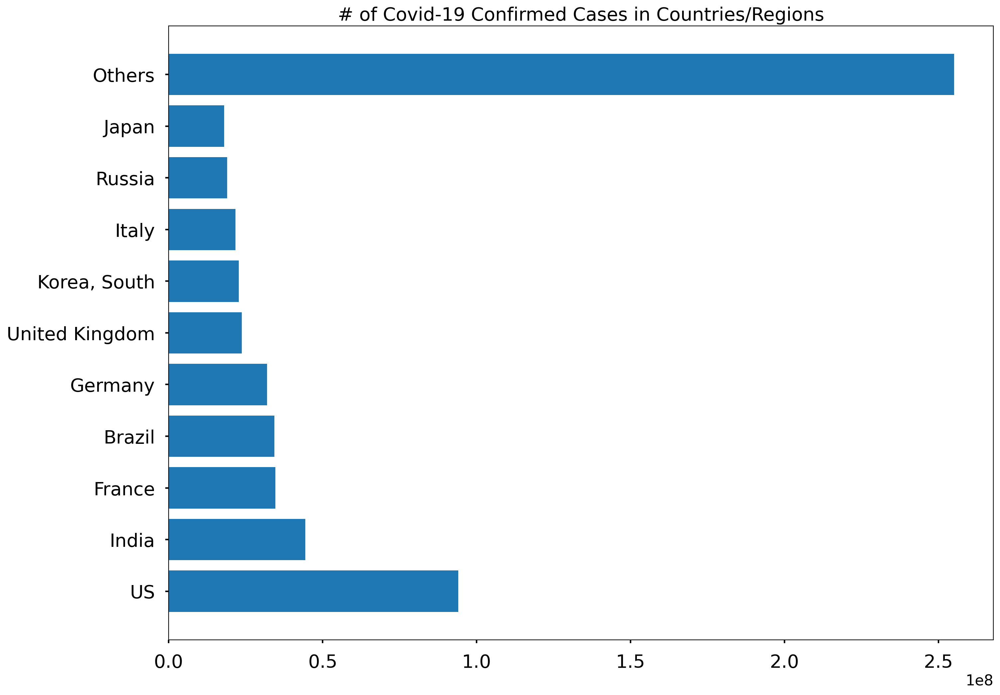

In [60]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of Covid-19 Confirmed Cases in Countries/Regions')

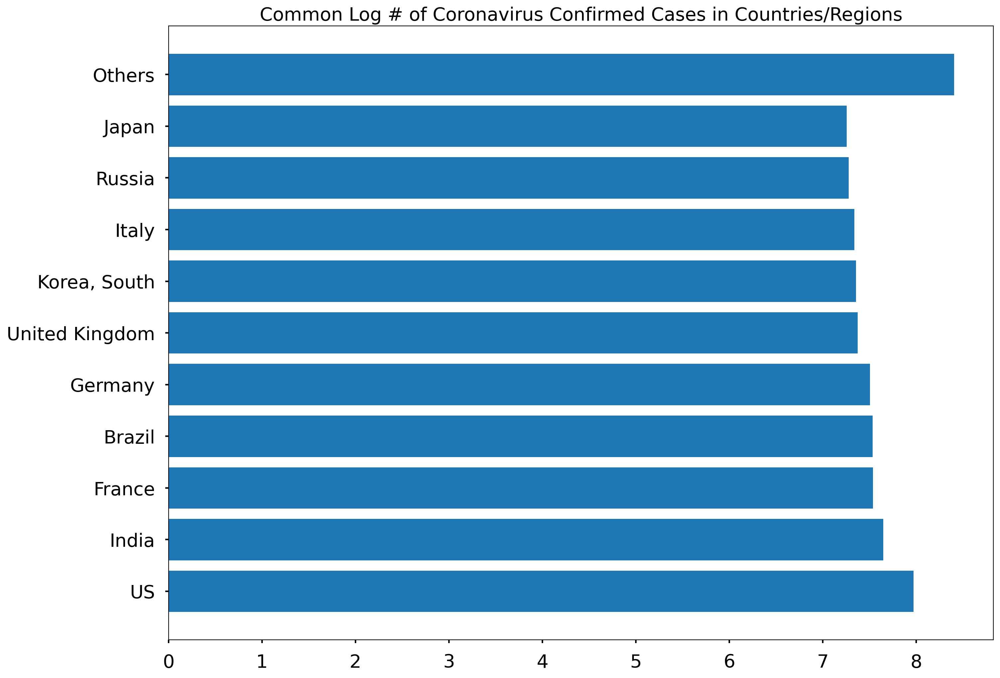

In [61]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')


In [62]:
# Only show 10 provinces with the most confirmed cases, the rest are grouped into the other category
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)


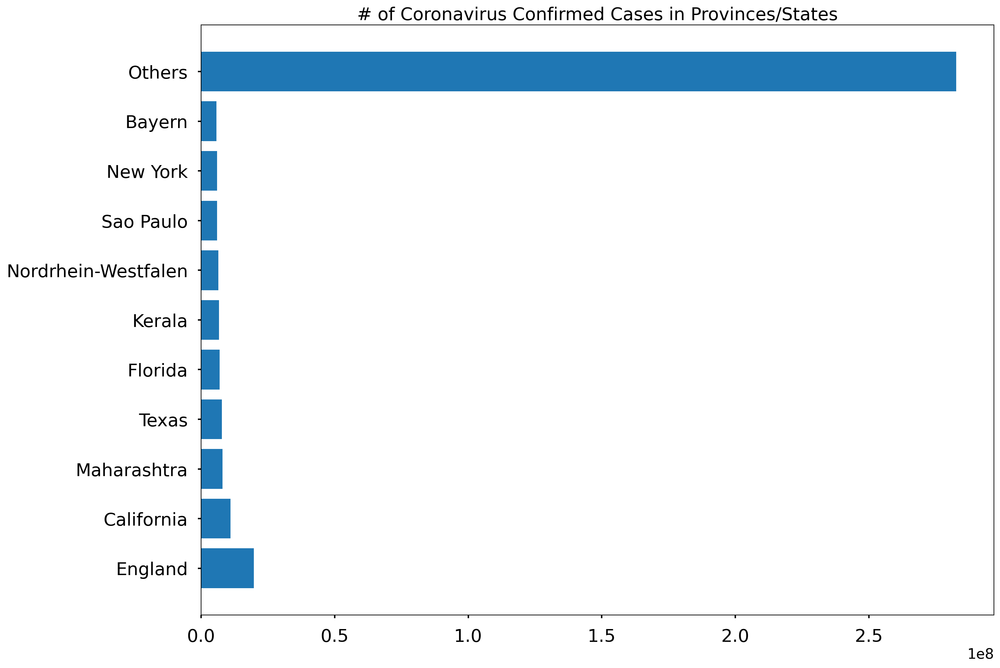

In [63]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

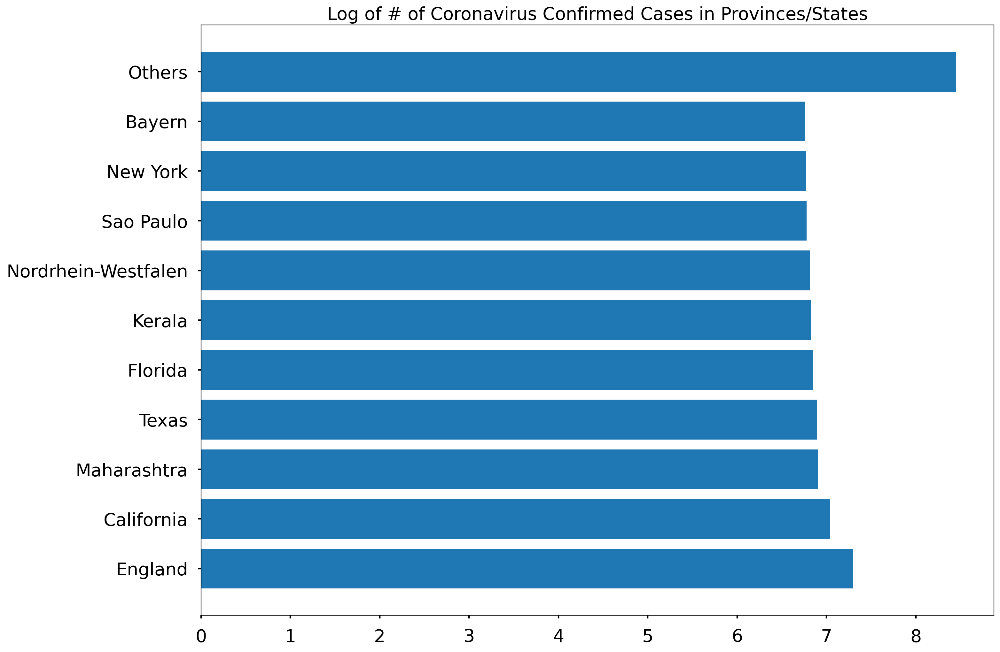

In [64]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')


In [65]:


def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()



     


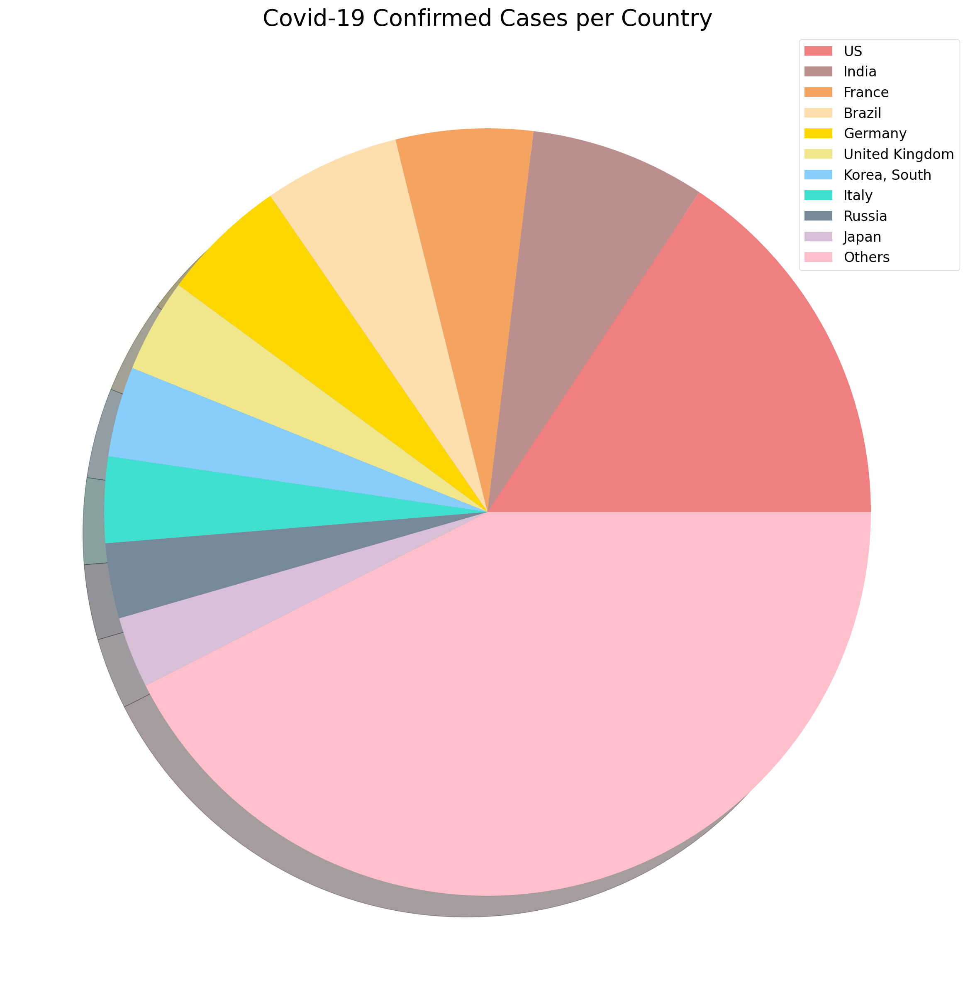

In [66]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

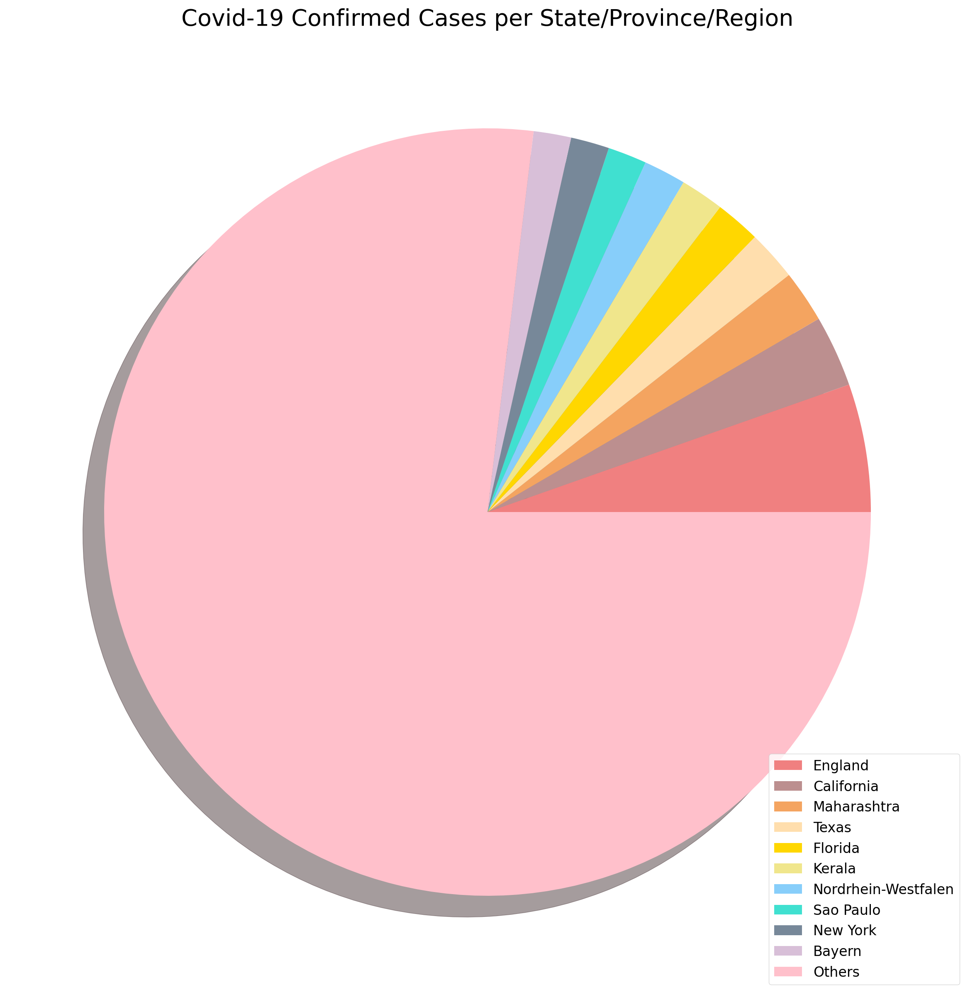

In [67]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [68]:
# Plotting countries with regional data using a pie chart 

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    # only show the top 5 states
    # Fixed indentation in this line
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
    
    # additional province/state will be considered "others"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

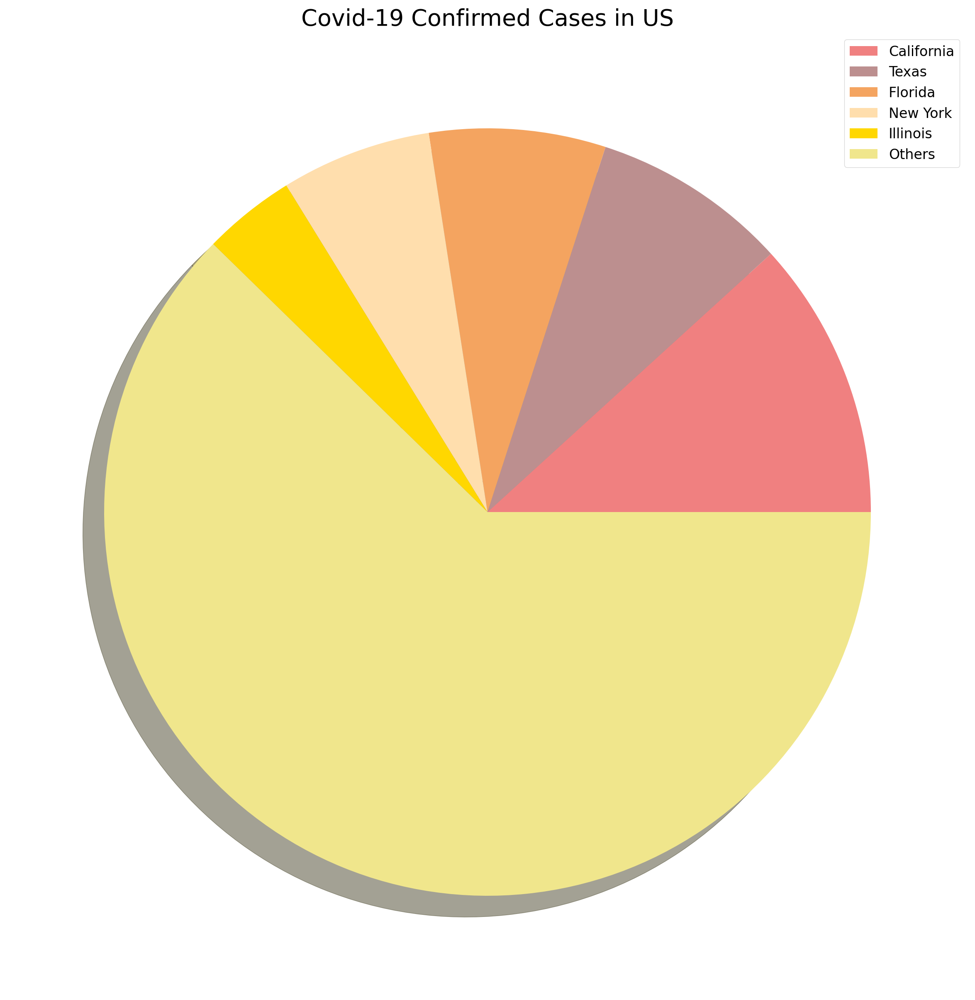

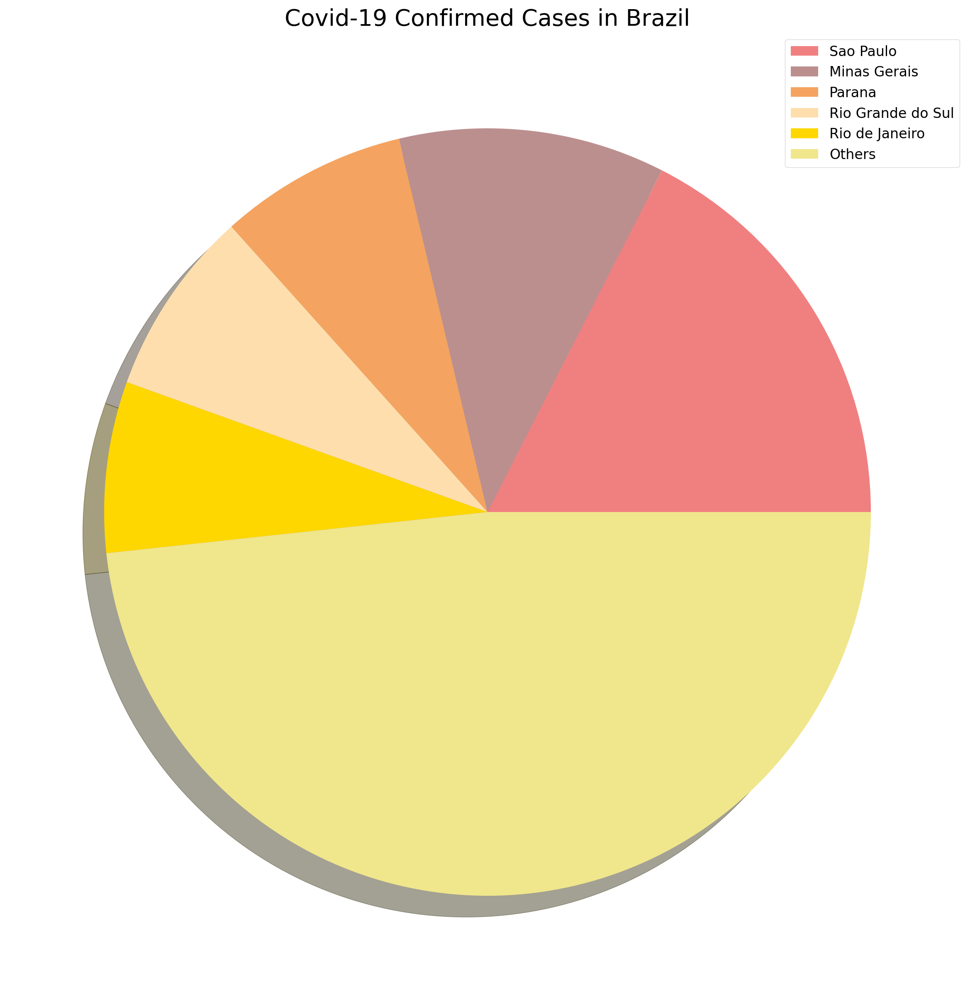

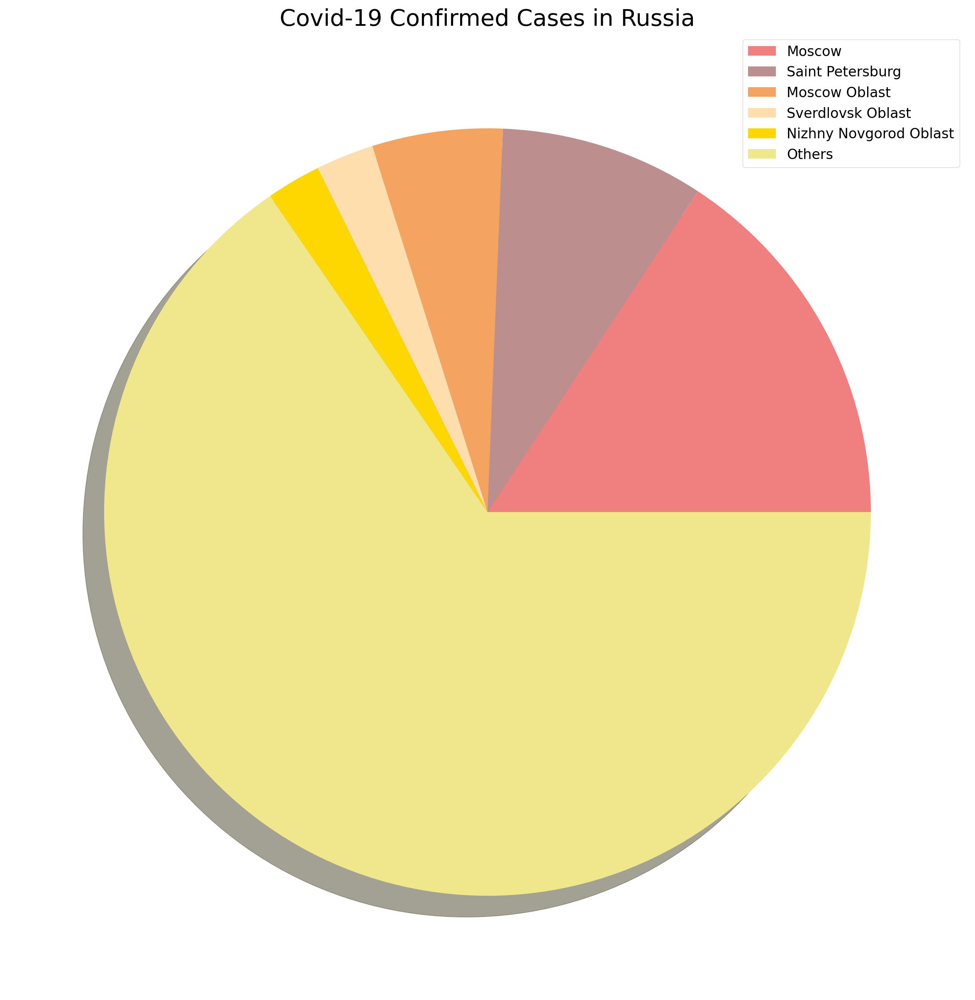

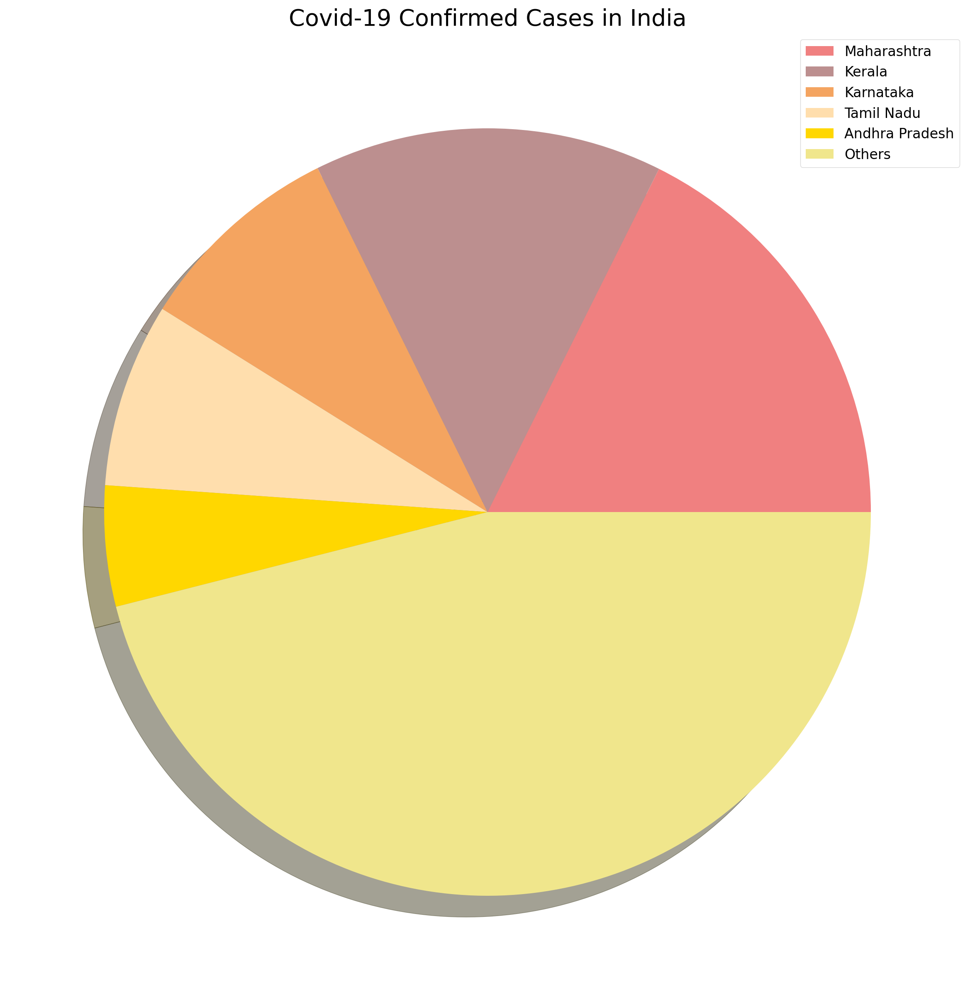

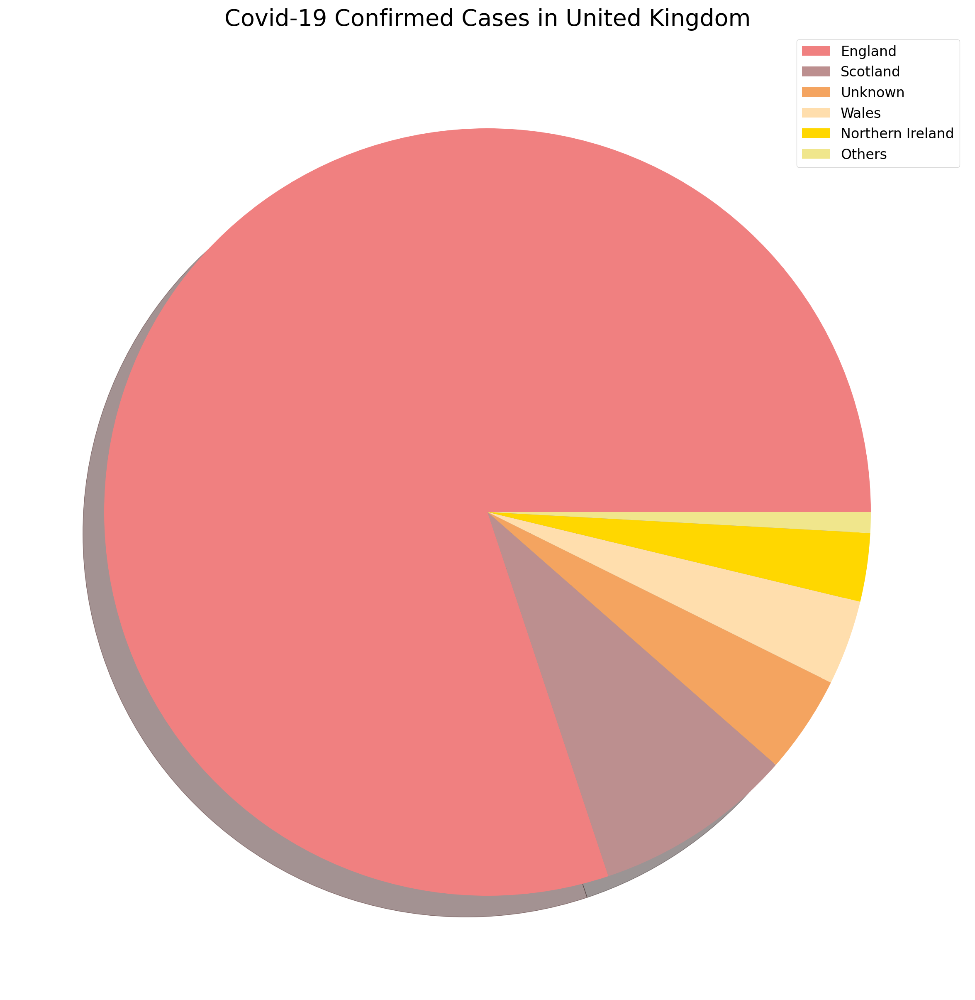

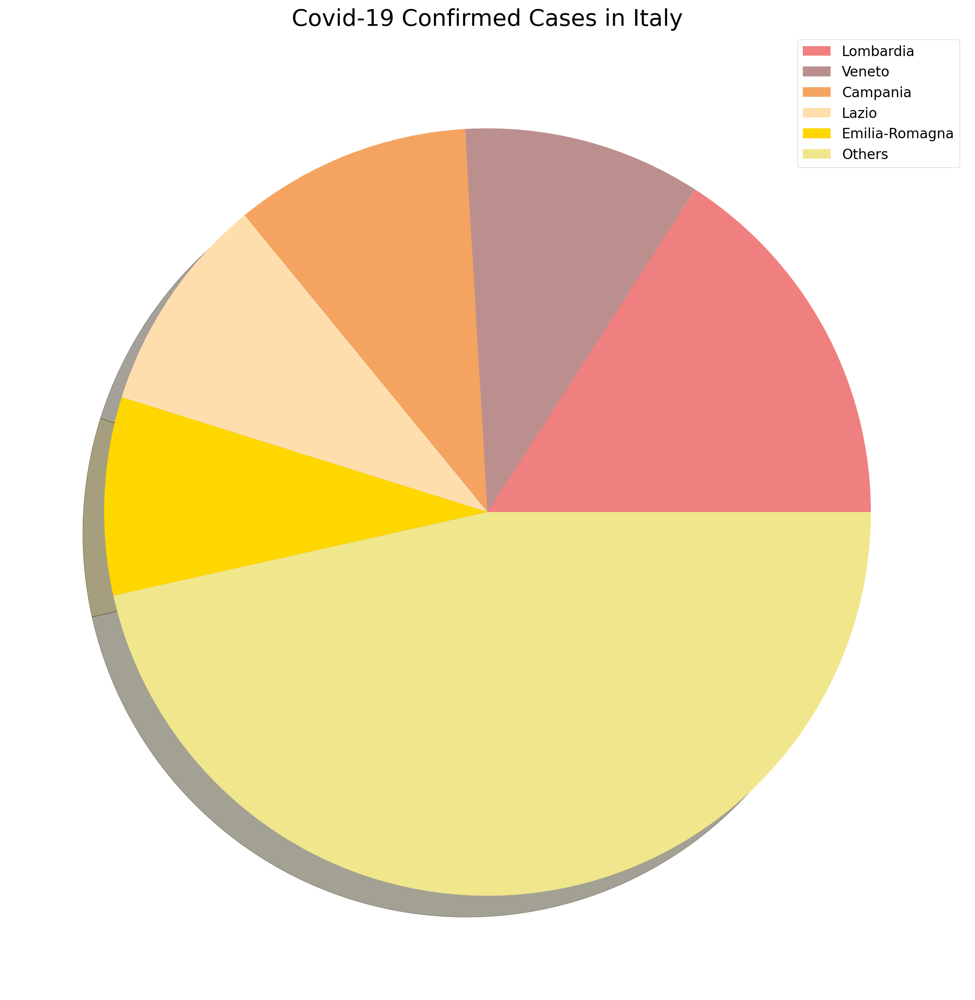

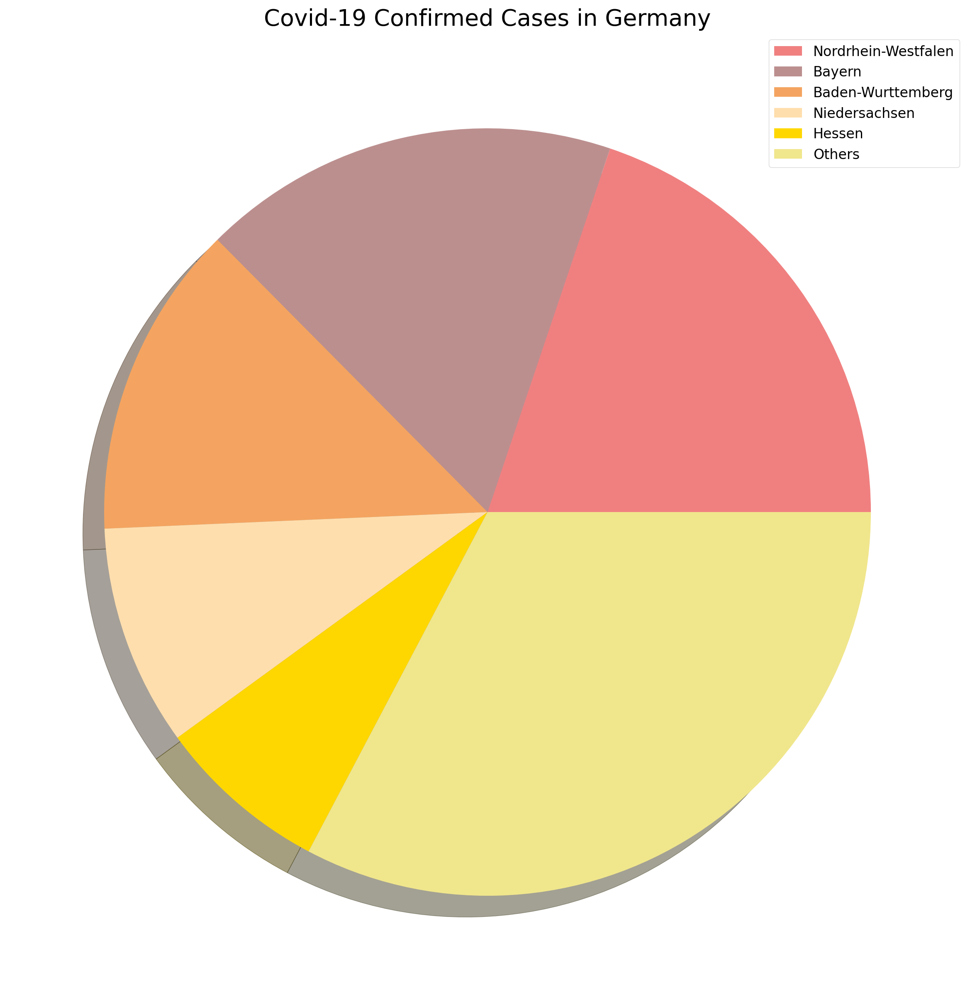

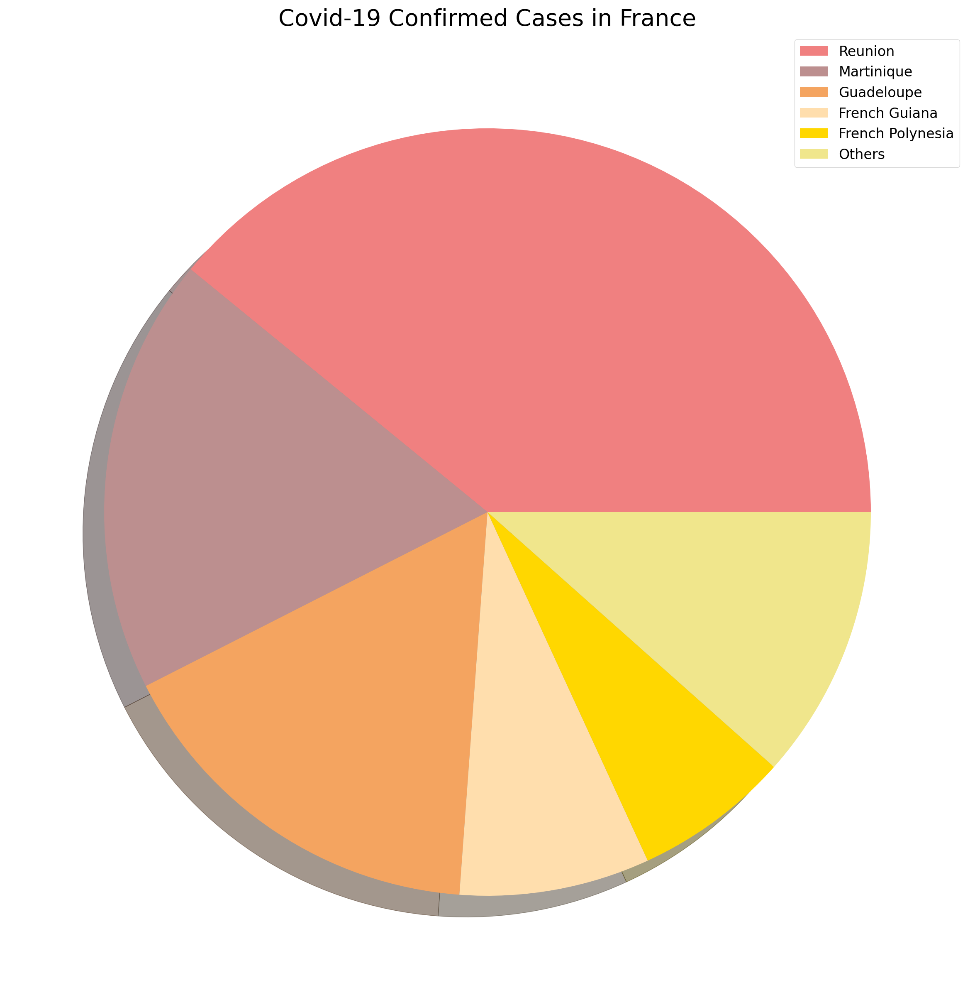

In [69]:


pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'United Kingdom', 'Italy', 'Germany', 'France']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))



     


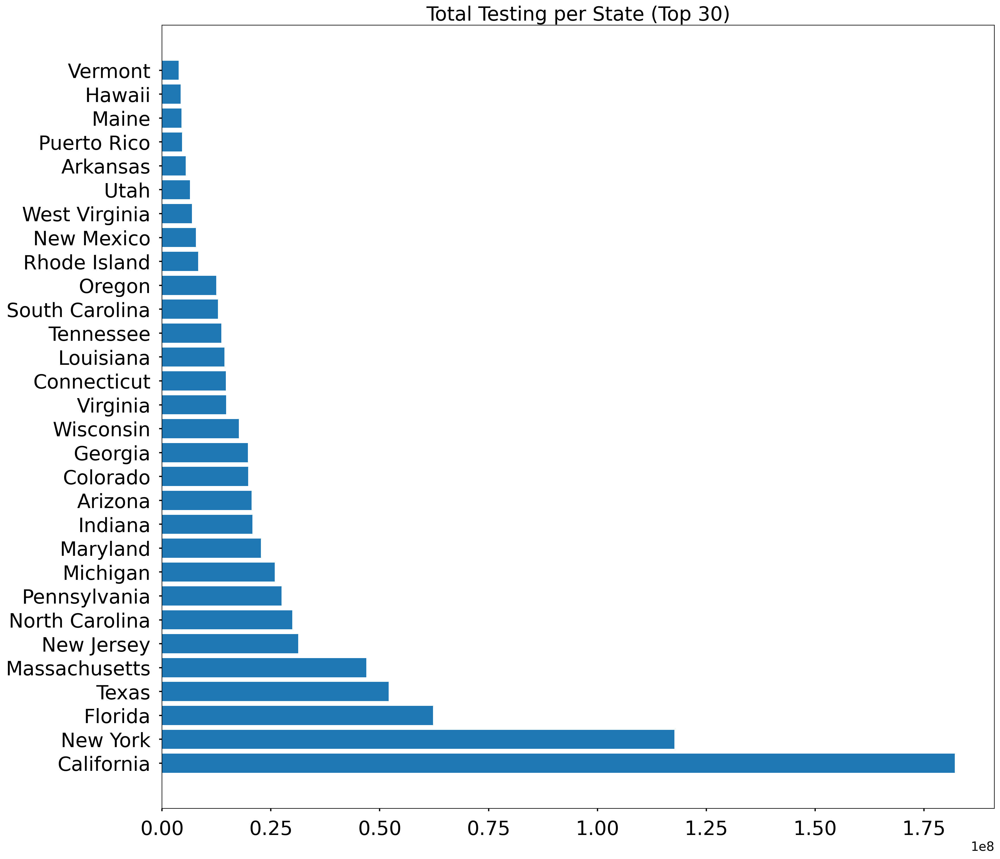

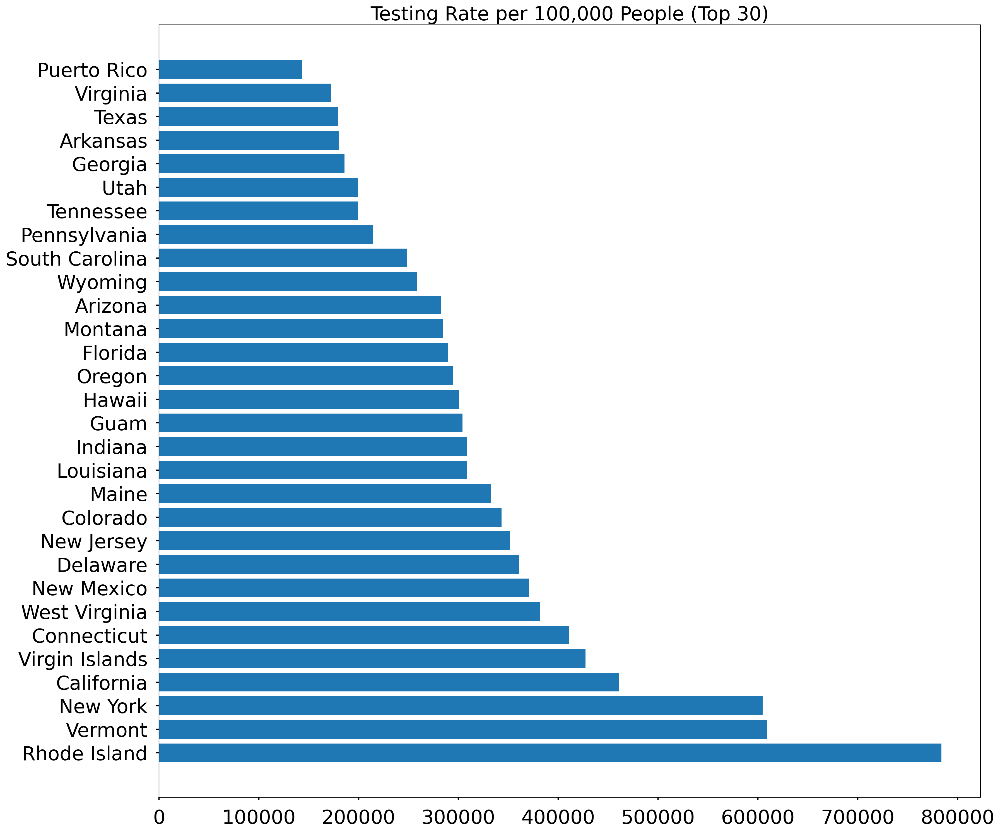

In [70]:
# Replace nan with 0
us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
    states = us_medical_data['Province_State'].unique()
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']==i]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']==i]['Testing_Rate'].max())
    
    # only show the top 15 states
    testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
    testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]
  
    for i in range(len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']==testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']==testing_rate_states[i]]['Testing_Rate'].sum()
    
    top_limit = 30 
    
    plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (Top 30)')
    plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing Rate per 100,000 People (Top 30)')
 

plot_us_medical_data()


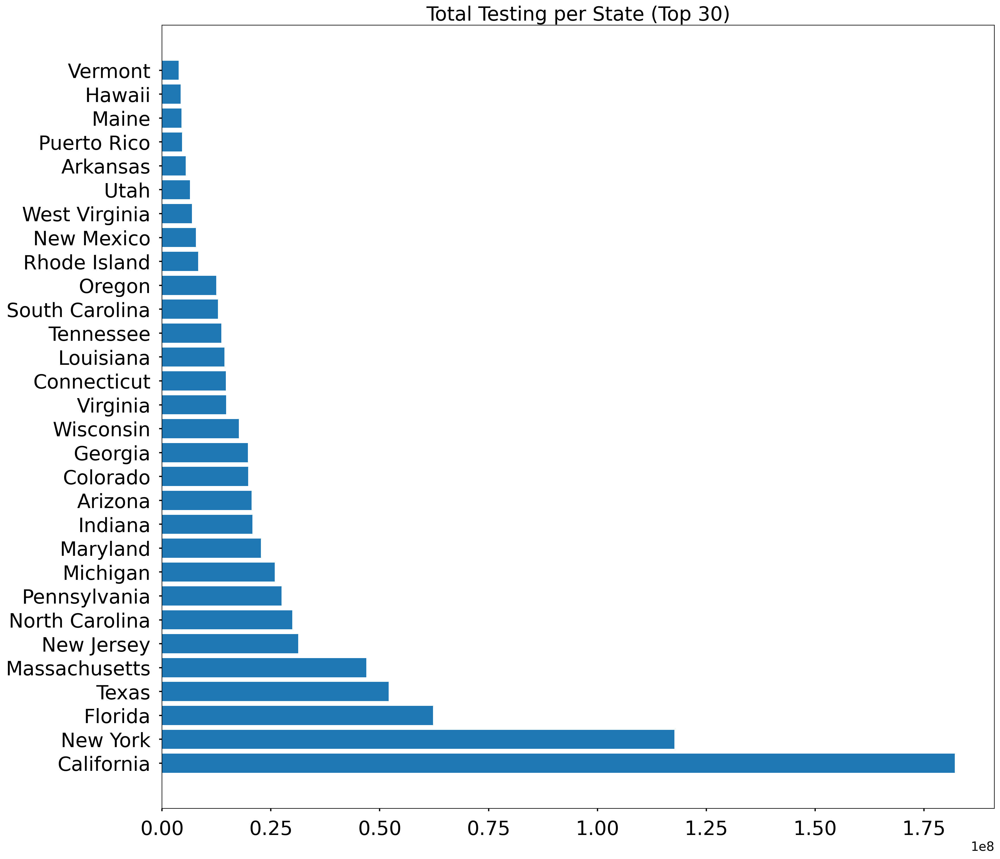

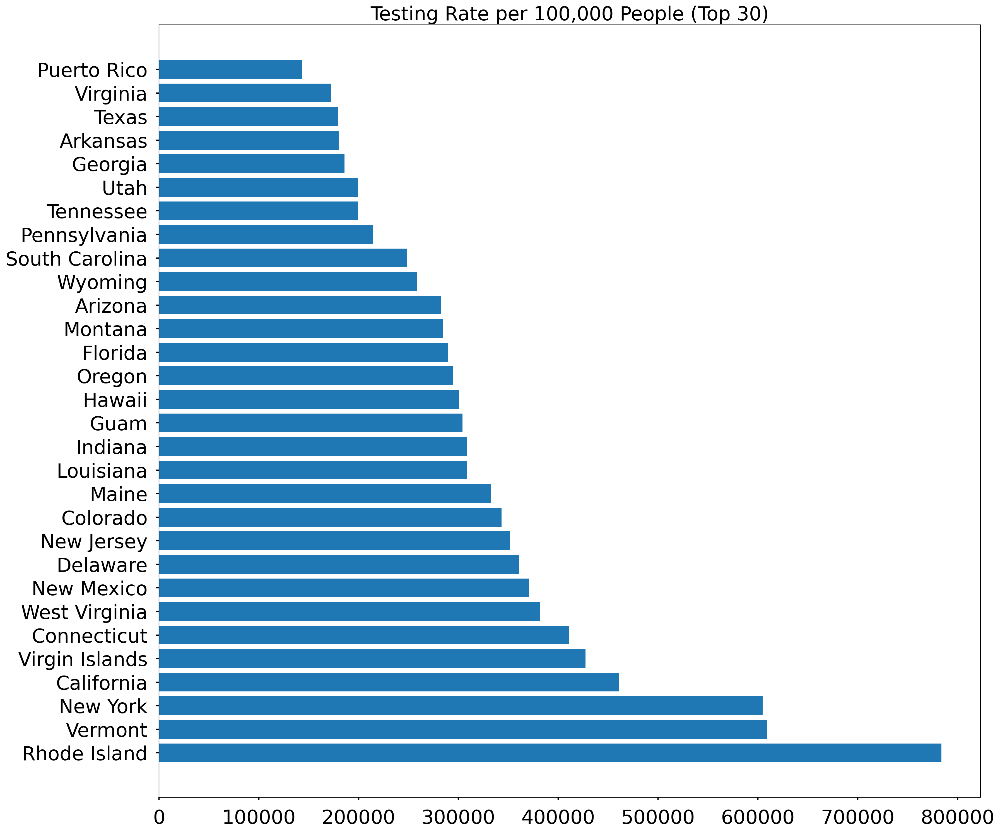

In [71]:
# Replace nan with 0
us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
    states = us_medical_data['Province_State'].unique()
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']==i]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']==i]['Testing_Rate'].max())
    
    # only show the top 15 states
    testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
    testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]
  
    for i in range(len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']==testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']==testing_rate_states[i]]['Testing_Rate'].sum()
    
    top_limit = 30 
    
    plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (Top 30)')
    plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing Rate per 100,000 People (Top 30)')
 

plot_us_medical_data()
